In [23]:
import pandas as pd
import numpy as np
import ast

import os
import matplotlib.pyplot as plt
import seaborn as sns
from plinder_analysis_utils import DockingAnalysisBase, PoseBustersAnalysis, PropertyAnalysis

In [24]:
PLINDER_TEST_COLUMNS = [
    "system_id", "ligand_smiles",
    # binary 
    # "ligand_is_covalent", "ligand_is_ion", "ligand_is_cofactor", "ligand_is_artifact",
    # discrete
    "system_num_protein_chains",
    "ligand_num_rot_bonds", "ligand_num_hbd", "ligand_num_hba", "ligand_num_rings",
    # continuous
    "entry_resolution", "entry_validation_molprobity", 
    "system_num_pocket_residues", "system_num_interactions",
    "ligand_molecular_weight", "ligand_crippen_clogp", 
    "ligand_num_interacting_residues", "ligand_num_neighboring_residues", "ligand_num_interactions",
]
# Create category mapping for visualization
CATEGORY_MAPPING = {
    "ligand_is_covalent": "binary",
    "ligand_is_ion": "binary",
    "ligand_is_cofactor": "binary",
    "ligand_is_artifact": "binary",
    "system_num_protein_chains": "discrete",
    "ligand_num_rot_bonds": "continuous",    
    "ligand_num_hbd": "continuous",
    "ligand_num_hba": "continuous",
    "ligand_num_rings": "continuous",
    "entry_resolution": "continuous",
    "entry_validation_molprobity": "continuous",
    "system_num_pocket_residues": "continuous",
    "system_num_interactions": "continuous",
    "ligand_molecular_weight": "continuous",
    "ligand_crippen_clogp": "continuous",
    "ligand_num_interacting_residues": "continuous",
    "ligand_num_neighboring_residues": "continuous",
    "ligand_num_interactions": "continuous",
    "ligand_is_artifact": "binary"     
}

In [25]:
df_combined = pd.read_csv("plinder_set_0_annotated.csv")

/var/folders/bb/dyy85zps4_lg79d6g6g48ms00000gn/T/ipykernel_21032/2737273468.py:1: DtypeWarning: Columns (78) have mixed types. Specify dtype option on import or set low_memory=False.
  df_combined = pd.read_csv("plinder_set_0_annotated.csv")


In [26]:
# build a boolean mask: drop any row where covalent, ionic or has_ion is True
mask = ~(
    df_combined['ligand_is_covalent'] |
    df_combined['ligand_is_ion'] |
    df_combined['has_ion'] |
    df_combined['ligand_is_cofactor']
)

# filter and reset index
df_combined = df_combined.loc[mask].reset_index(drop=True)
print("Filtered shape:", df_combined.shape)

Filtered shape: (14961, 154)


In [27]:
# First analyze multiple properties
property_analysis = PropertyAnalysis(df_combined)
methods = ["surfdock", "gnina", "chai-1", "diffdock_pocket_only", "icm", "vina"]

## Universal Analysis 

Analyzing system_num_protein_chains for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of discrete property 'system_num_protein_chains':
Categories: [1.0]
Counts (success vs failure):
  system_num_protein_chains  success_count  failure_count
0                       1.0             78             36
Chi-square test: statistic=0.000, p-value=1.000000


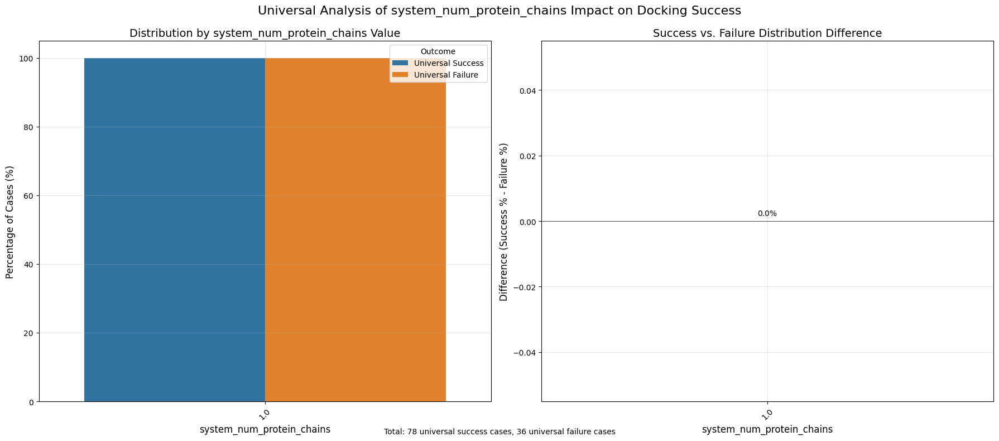

Analyzing ligand_num_rot_bonds for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_rot_bonds':
Success cases: n=90, mean=5.692, std=3.648
Failure cases: n=102, mean=12.333, std=5.667
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.376
Chi-square test for distribution: p=0.000000


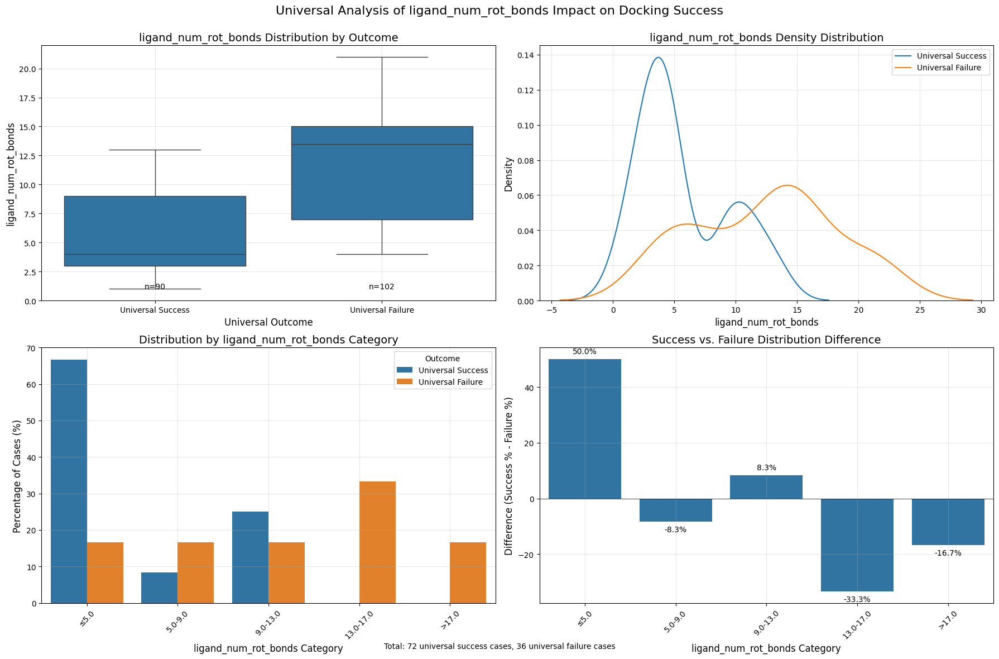

Analyzing ligand_num_hbd for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_hbd':
Success cases: n=90, mean=2.385, std=2.353
Failure cases: n=102, mean=7.667, std=1.265
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.846
Chi-square test for distribution: p=0.000000


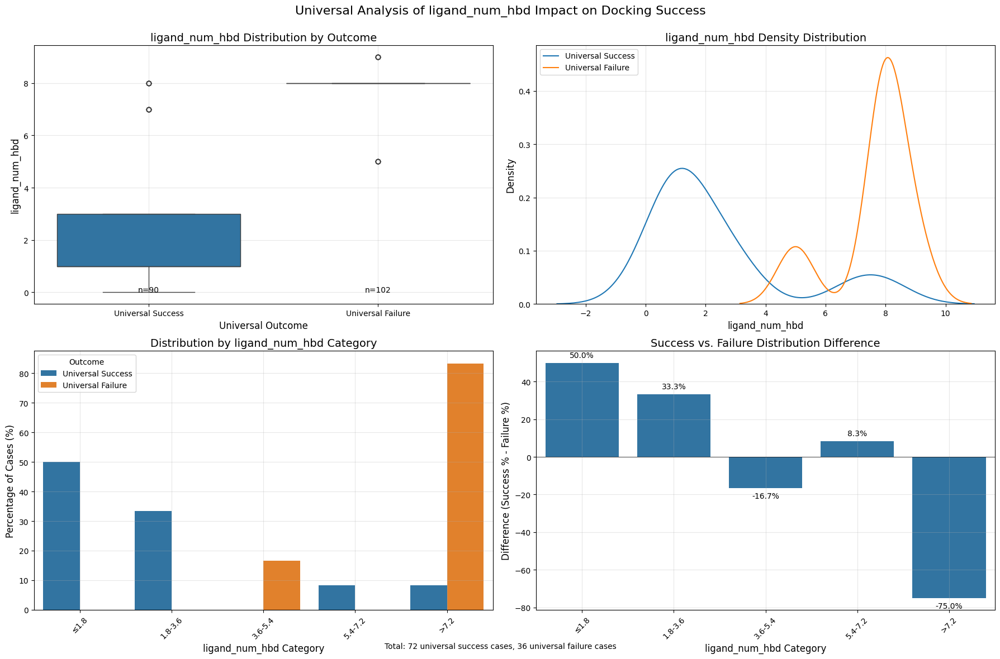

Analyzing ligand_num_hba for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_hba':
Success cases: n=90, mean=5.923, std=2.542
Failure cases: n=102, mean=8.333, std=1.821
Mann-Whitney U test: p=0.000001
Effect size (Cohen's d): 1.101
Chi-square test for distribution: p=0.002746


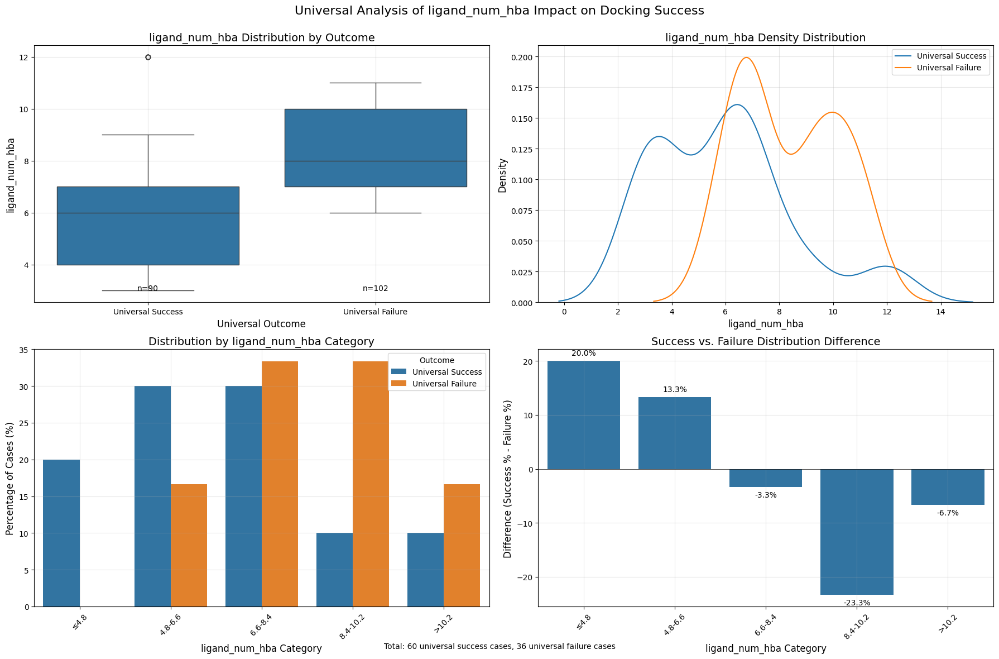

Analyzing ligand_num_rings for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_rings':
Success cases: n=90, mean=3.077, std=1.394
Failure cases: n=102, mean=1.000, std=0.828
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.840
Chi-square test for distribution: p=0.000009


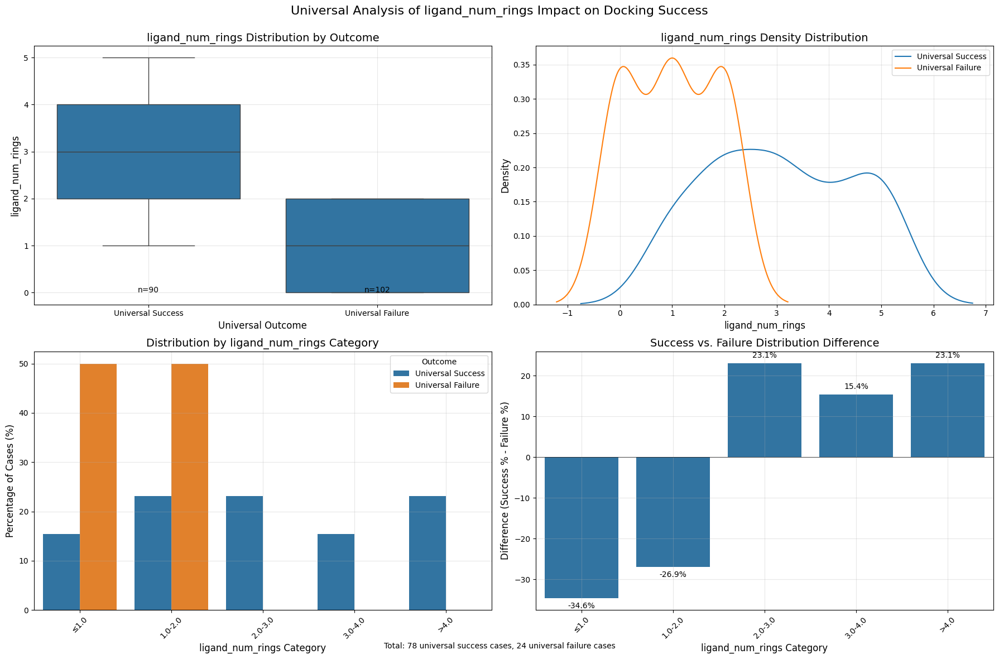

Analyzing entry_resolution for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'entry_resolution':
Success cases: n=90, mean=2.186, std=0.359
Failure cases: n=102, mean=2.400, std=0.437
Mann-Whitney U test: p=0.008382
Effect size (Cohen's d): 0.531


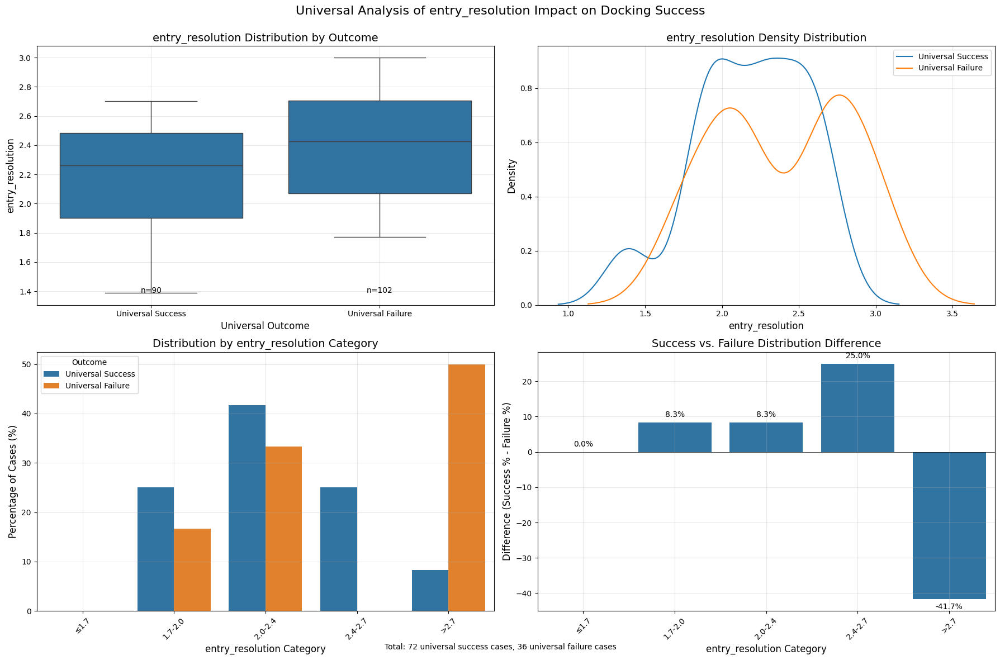

Analyzing entry_validation_molprobity for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'entry_validation_molprobity':
Success cases: n=90, mean=1.432, std=0.452
Failure cases: n=102, mean=1.715, std=0.573
Mann-Whitney U test: p=0.048203
Effect size (Cohen's d): 0.543


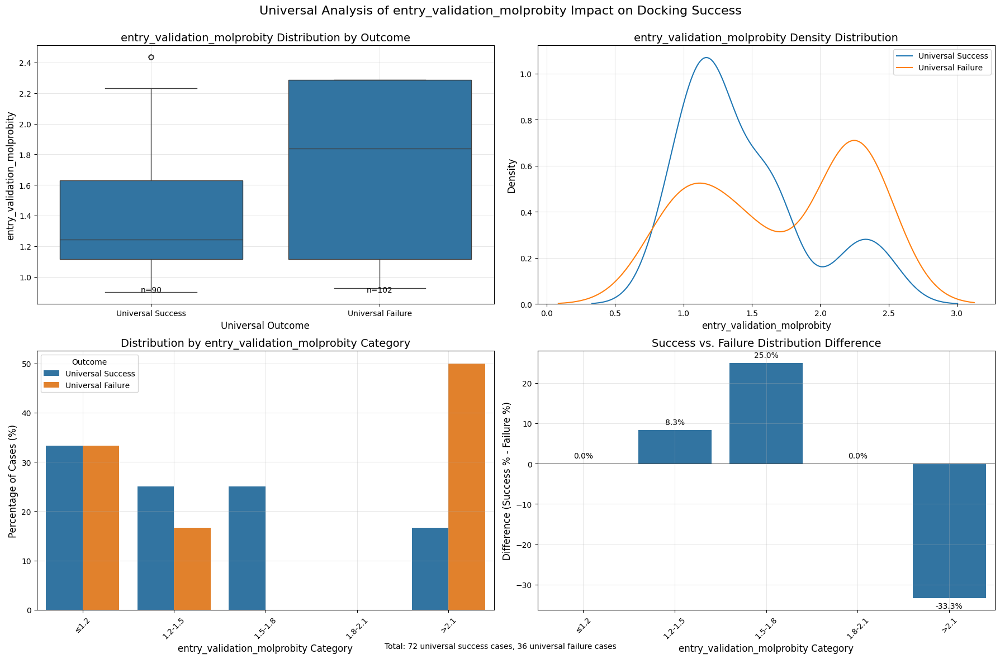

Analyzing system_num_pocket_residues for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'system_num_pocket_residues':
Success cases: n=90, mean=27.231, std=6.896
Failure cases: n=102, mean=16.000, std=2.619
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.206
Chi-square test for distribution: p=0.000000


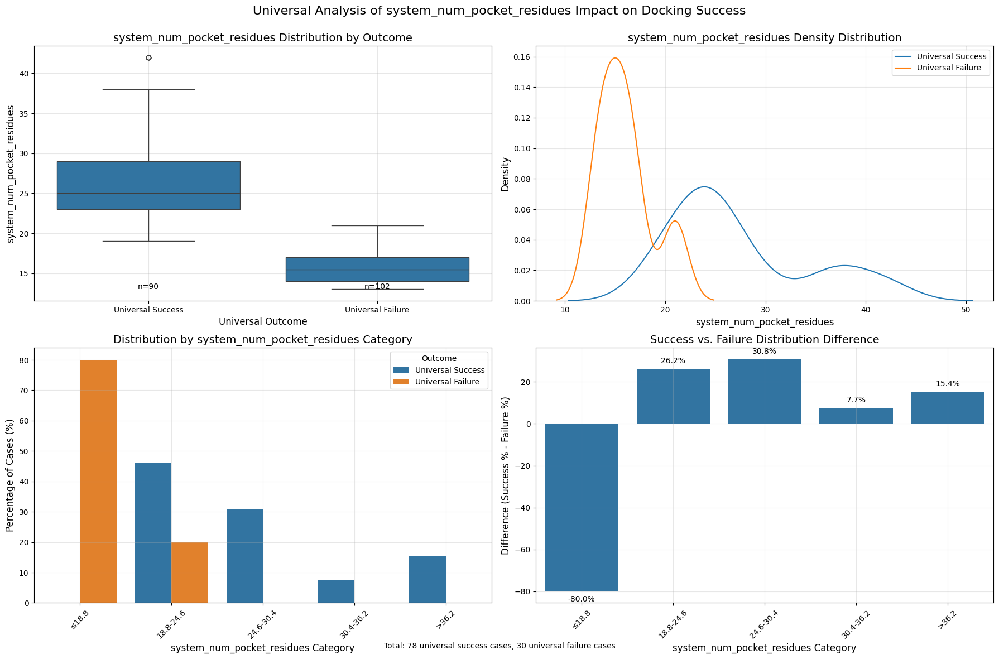

Analyzing system_num_interactions for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'system_num_interactions':
Success cases: n=90, mean=12.462, std=4.829
Failure cases: n=102, mean=7.500, std=3.351
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.207


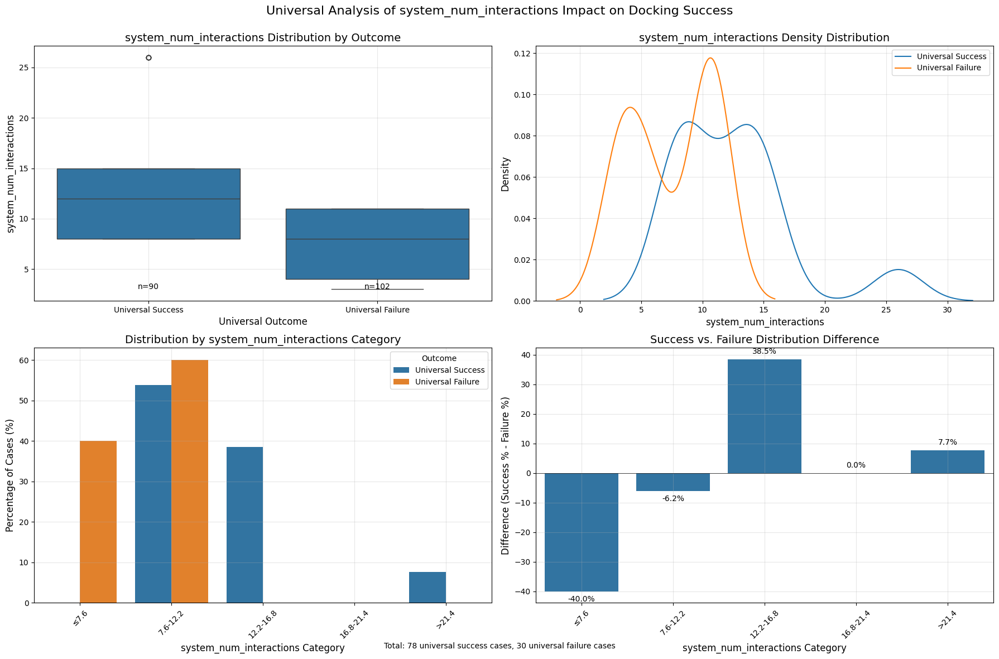

Analyzing ligand_molecular_weight for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_molecular_weight':
Success cases: n=90, mean=392.126, std=119.079
Failure cases: n=102, mean=478.055, std=127.455
Mann-Whitney U test: p=0.000077
Effect size (Cohen's d): 0.695
Chi-square test for distribution: p=0.000000


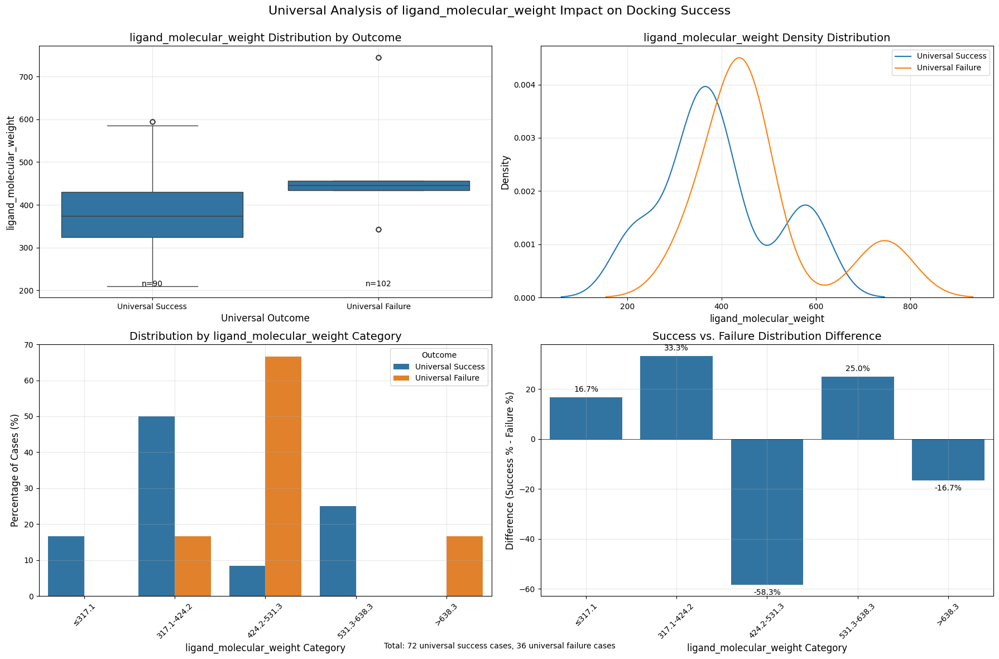

Analyzing ligand_crippen_clogp for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_crippen_clogp':
Success cases: n=90, mean=2.217, std=3.130
Failure cases: n=102, mean=-2.986, std=1.943
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.026
Chi-square test for distribution: p=0.000000


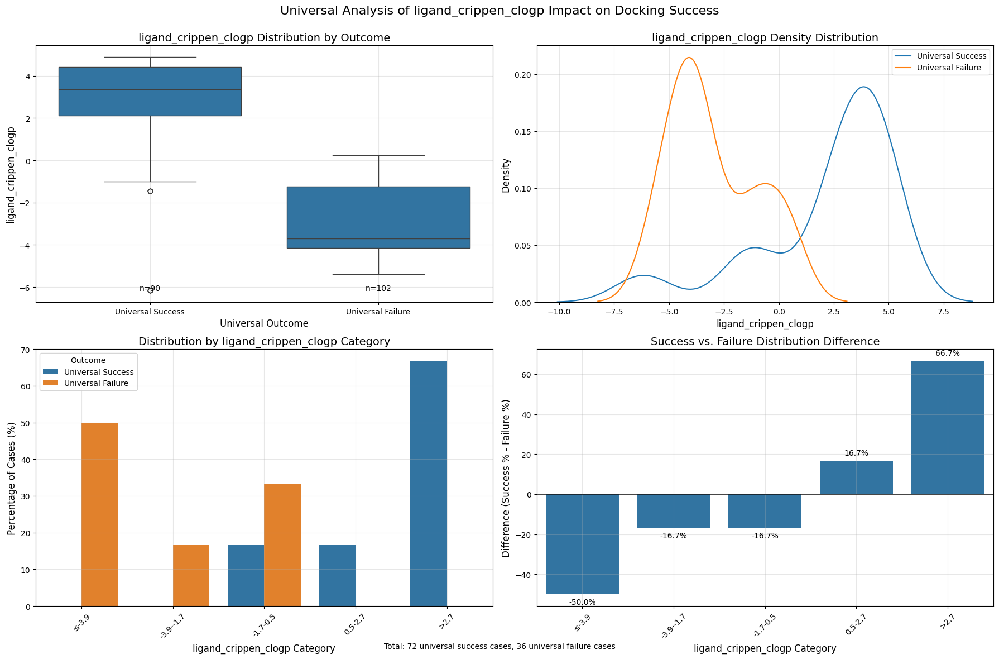

Analyzing ligand_num_interacting_residues for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_interacting_residues':
Success cases: n=90, mean=9.231, std=2.711
Failure cases: n=102, mean=5.500, std=2.667
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.388
Chi-square test for distribution: p=0.000000


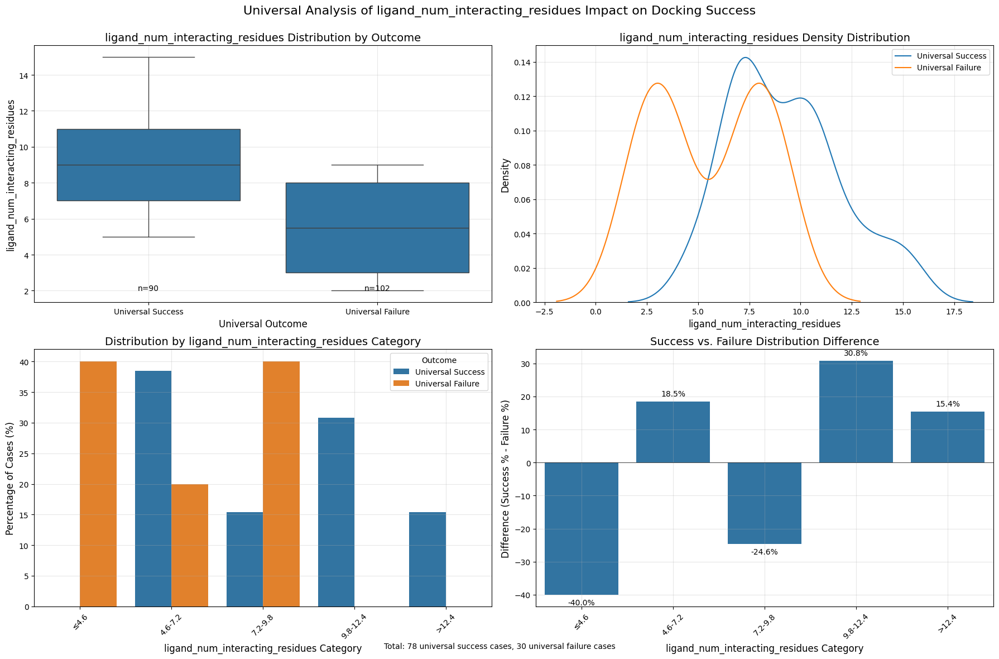

Analyzing ligand_num_neighboring_residues for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_neighboring_residues':
Success cases: n=90, mean=27.231, std=6.896
Failure cases: n=102, mean=16.000, std=2.619
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.206
Chi-square test for distribution: p=0.000000


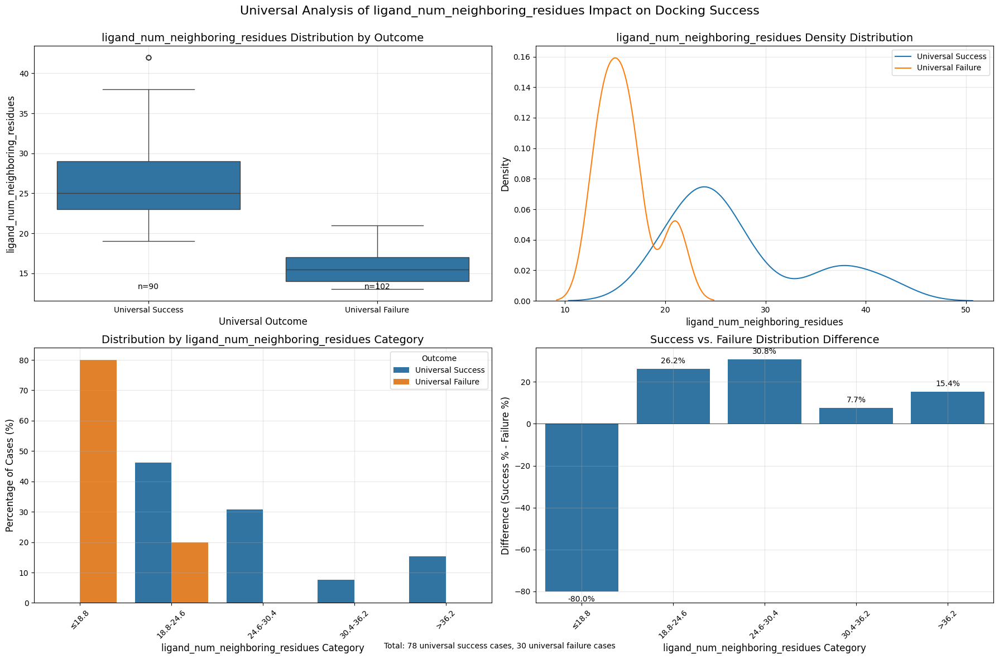

Analyzing ligand_num_interactions for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_interactions':
Success cases: n=90, mean=12.462, std=4.829
Failure cases: n=102, mean=7.500, std=3.351
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.207


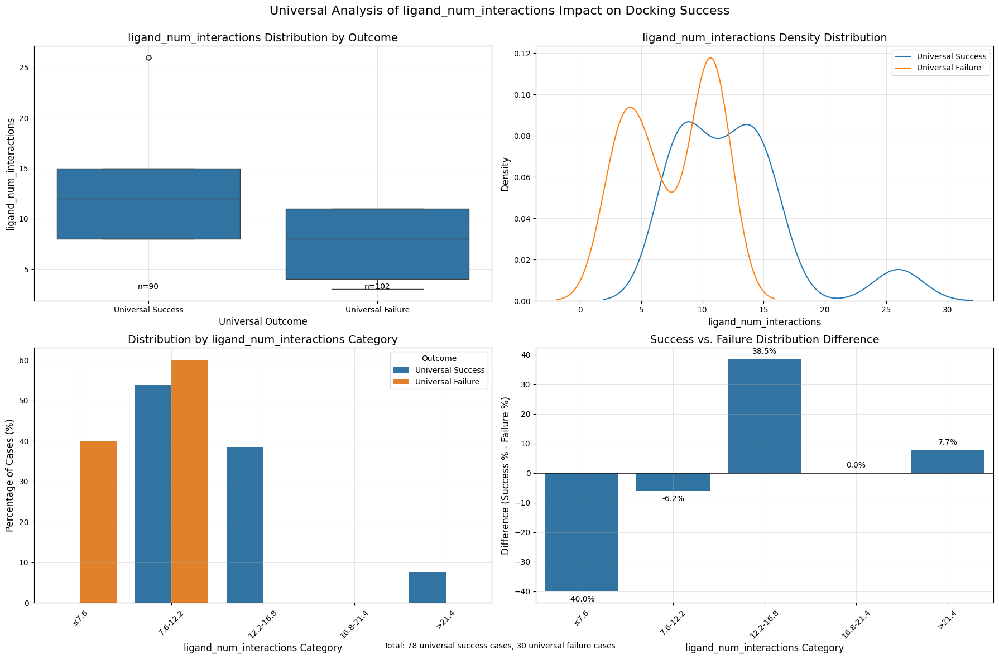

In [7]:
all_results = []

for prop in PLINDER_TEST_COLUMNS[2:]:
    # 2. Explore impact of properties on a single method
    prop_type = CATEGORY_MAPPING[prop]
    prop_analysis = property_analysis.analyze_property_universal(
        methods, prop, prop_type,
    )
    all_results.append(prop_analysis)

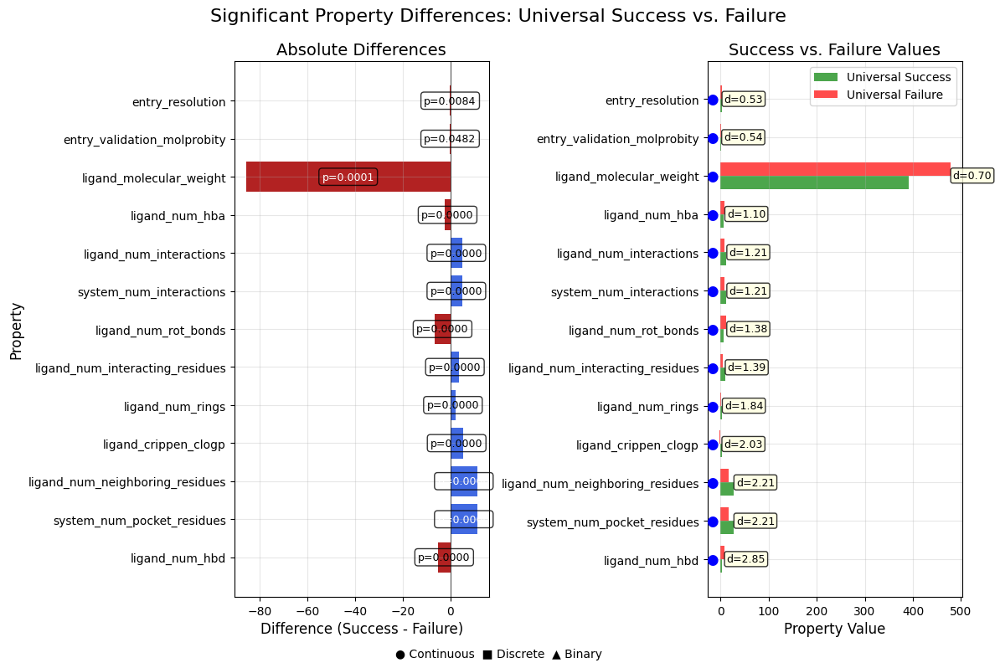

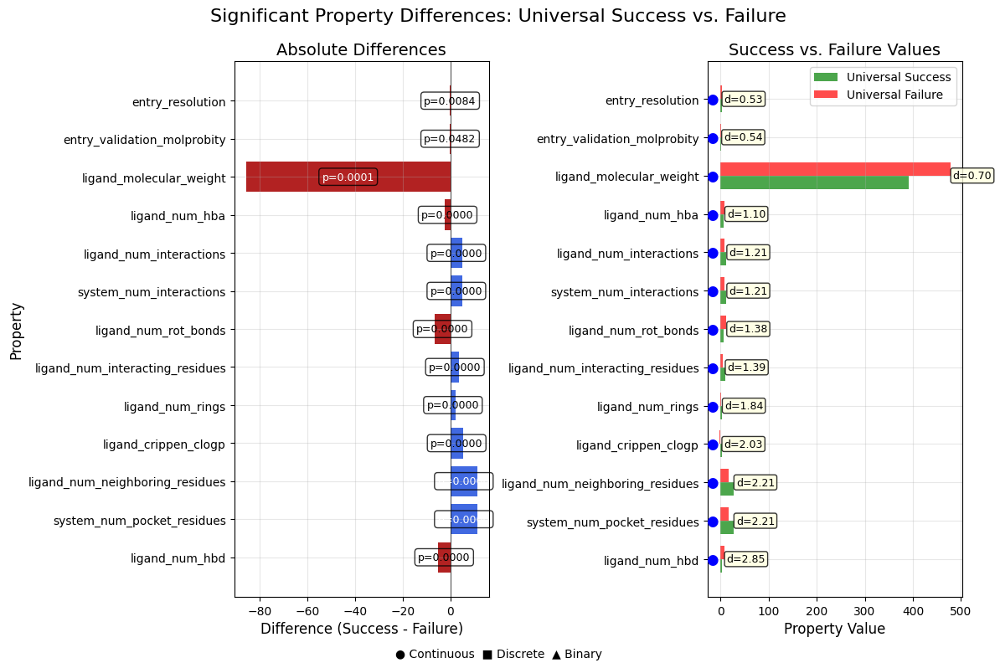

In [8]:
# Plot significant differences 
property_analysis.plot_significant_property_differences(
    all_results, 
    p_threshold=0.05,
    sort_by='effect_size'
)

## Universal first and then boil down to Single Property Analysis

In [9]:
# df_combined[df_combined['method'] == 'icm'][PLINDER_TEST_COLUMNS].isna().sum(axis=0)
# print(df_combined[df_combined['method'] == 'icm'].shape)
# # Filter for ICM method
# icm_data = df_combined[df_combined['method'] == 'icm']

# # Count rows with NaN values in PLINDER_TEST_COLUMNS
# nan_mask = icm_data[PLINDER_TEST_COLUMNS].isna().any(axis=1)
# nan_count = nan_mask.sum()
# print(f"Number of ICM rows with NaN values in test columns: {nan_count} out of {len(icm_data)}")

# # Create clean version of ICM data by dropping NaN rows
# icm_data_clean = icm_data.dropna(subset=PLINDER_TEST_COLUMNS)
# print(f"ICM data shape after dropping NaN rows: {icm_data_clean.shape}")

# # Update the original DataFrame to replace ICM data with the clean version
# mask = df_combined['method'] == 'icm'
# df_combined = pd.concat([df_combined[~mask], icm_data_clean], ignore_index=True)
# print(f"Updated combined DataFrame shape: {df_combined.shape}")

# # Check if there are any remaining NaN values in the ICM data
# remaining_nans = df_combined[df_combined['method'] == 'icm'][PLINDER_TEST_COLUMNS].isna().any(axis=1).sum()
# print(f"Remaining ICM rows with NaN values: {remaining_nans}")


#### system_num_protein_chains

In [ ]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="system_num_protein_chains",
    property_type="discrete",
    plot=True  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="system_num_protein_chains",
        property_type="discrete",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="system_num_protein_chains",
    property_type="discrete",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

Analyzing system_num_protein_chains for 15 cases where all methods succeed
and 17 cases where all methods fail


ValueError: Bin edges must be unique: array([ 1.,  1.,  1.,  1.,  1., inf]).
You can drop duplicate edges by setting the 'duplicates' kwarg

#### ligand_num_rot_bonds

Analyzing ligand_num_rot_bonds for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_rot_bonds':
Success cases: n=90, mean=5.692, std=3.648
Failure cases: n=102, mean=12.333, std=5.667
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.376
Chi-square test for distribution: p=0.000000


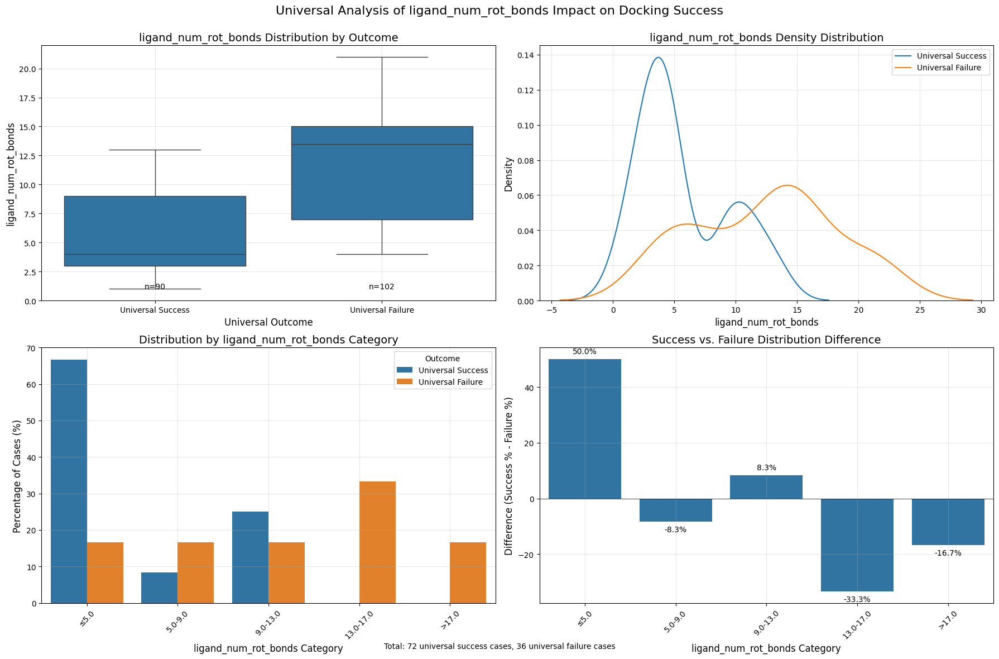

/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of ligand_num_rot_bonds on Docking RMSD for surfdock
Pearson correlation: 0.1807, p-value: 0.001448
Spearman correlation: 0.3786, p-value: 0.000000


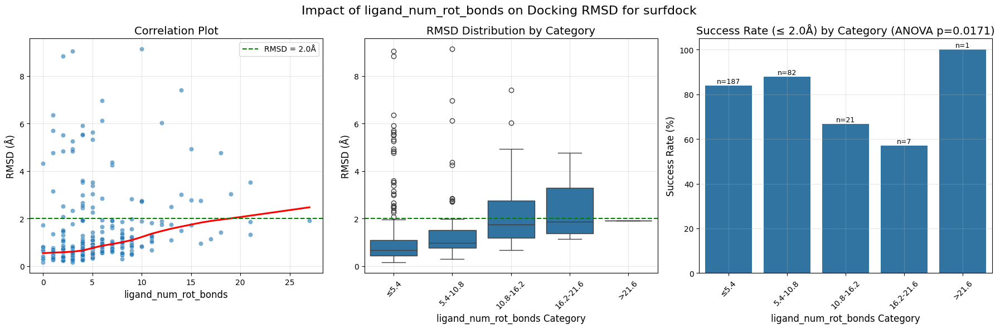


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate  mean_rmsd
0                          ≤5.4          187     83.957219   1.256006
1                      5.4-10.8           82     87.804878   1.426093
2                     10.8-16.2           21     66.666667   2.307314
3                     16.2-21.6            7     57.142857   2.443595
4                         >21.6            1    100.000000   1.903425

ANOVA test: F=3.059, p=0.017143
Significant differences in RMSD across ligand_num_rot_bonds categories
Welch ANOVA p=0.017143 (used unbalanced‑sizes variant)
Kruskal–Wallis H=47.915, p=0.000000

Impact of ligand_num_rot_bonds on Docking RMSD for gnina
Pearson correlation: 0.4432, p-value: 0.000000
Spearman correlation: 0.4625, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


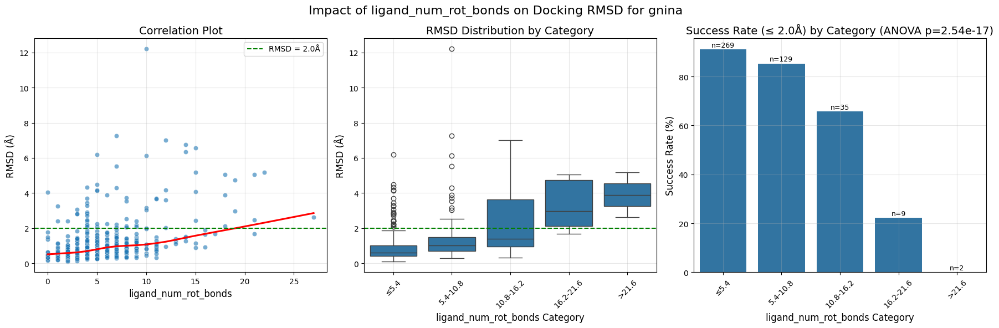


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate  mean_rmsd
0                          ≤5.4          269     91.078067   0.885533
1                      5.4-10.8          129     85.271318   1.373790
2                     10.8-16.2           35     65.714286   2.307638
3                     16.2-21.6            9     22.222222   3.294249
4                         >21.6            2      0.000000   3.898052

ANOVA test: F=23.070, p=0.000000
Significant differences in RMSD across ligand_num_rot_bonds categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=86.950, p=0.000000

Impact of ligand_num_rot_bonds on Docking RMSD for chai-1
Pearson correlation: -0.0391, p-value: 0.416279
Spearman correlation: 0.0290, p-value: 0.546329


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


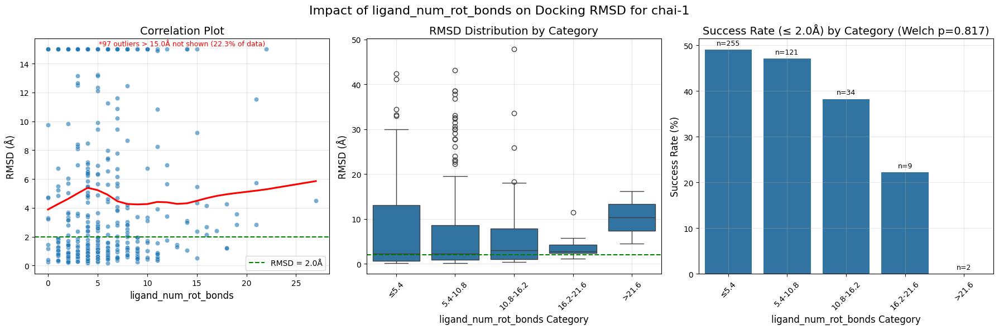


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate  mean_rmsd
0                          ≤5.4          255     49.019608   8.014517
1                      5.4-10.8          121     47.107438   8.012693
2                     10.8-16.2           34     38.235294   7.230527
3                     16.2-21.6            9     22.222222   3.955313
4                         >21.6            2      0.000000  10.369580

ANOVA test: F=0.388, p=0.817272
Welch ANOVA p=0.817272 (used unbalanced‑sizes variant)
Kruskal–Wallis H=1.642, p=0.801196

Impact of ligand_num_rot_bonds on Docking RMSD for diffdock_pocket_only
Pearson correlation: 0.0569, p-value: 0.239103
Spearman correlation: 0.0953, p-value: 0.048322


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


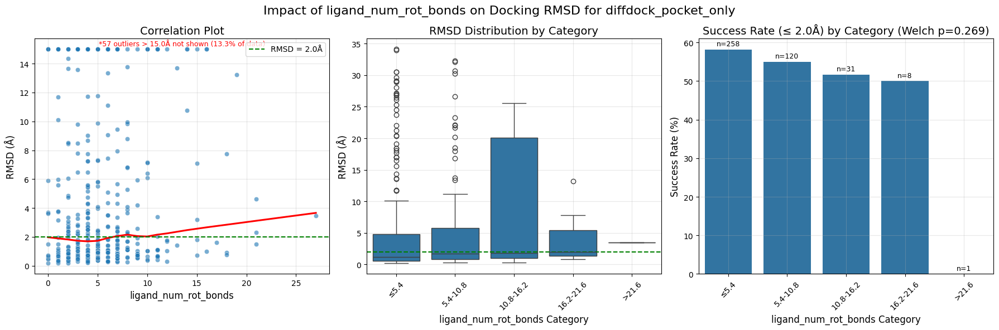


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate  mean_rmsd
0                          ≤5.4          258     58.139535   4.952417
1                      5.4-10.8          120     55.000000   5.048017
2                     10.8-16.2           31     51.612903   8.255034
3                     16.2-21.6            8     50.000000   4.087032
4                         >21.6            1      0.000000   3.446215

ANOVA test: F=1.301, p=0.268882
Welch ANOVA p=0.268882 (used unbalanced‑sizes variant)
Kruskal–Wallis H=7.563, p=0.108975

Impact of ligand_num_rot_bonds on Docking RMSD for icm
Pearson correlation: 0.2961, p-value: 0.000000
Spearman correlation: 0.3682, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


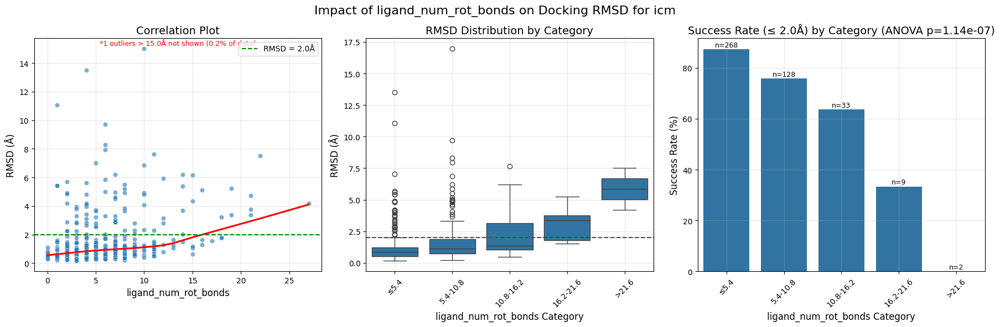


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate  mean_rmsd
0                          ≤5.4          268     87.313433   1.230235
1                      5.4-10.8          128     75.781250   1.872541
2                     10.8-16.2           33     63.636364   2.349994
3                     16.2-21.6            9     33.333333   3.196118
4                         >21.6            2      0.000000   5.860382

ANOVA test: F=9.896, p=0.000000
Significant differences in RMSD across ligand_num_rot_bonds categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=50.303, p=0.000000

Impact of ligand_num_rot_bonds on Docking RMSD for vina
Pearson correlation: 0.1232, p-value: 0.042746
Spearman correlation: 0.0916, p-value: 0.132384


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


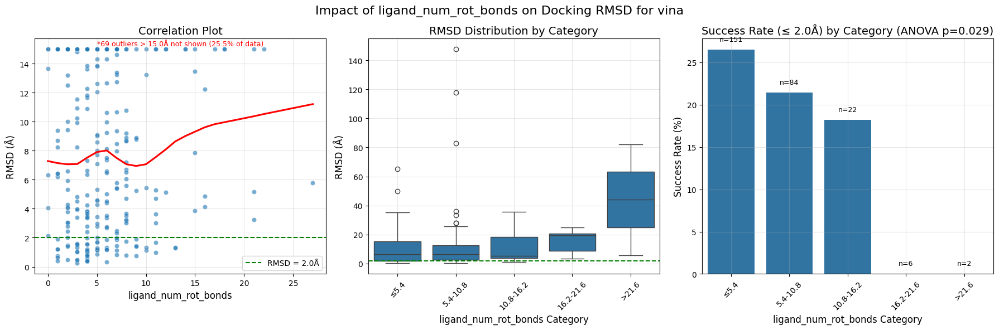


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate  mean_rmsd
0                          ≤5.4          151     26.490066   9.915675
1                      5.4-10.8           84     21.428571  12.316215
2                     10.8-16.2           22     18.181818  10.965762
3                     16.2-21.6            6      0.000000  15.599962
4                         >21.6            2      0.000000  43.997755

ANOVA test: F=2.744, p=0.028999
Significant differences in RMSD across ligand_num_rot_bonds categories
Welch ANOVA p=0.028999 (used unbalanced‑sizes variant)
Kruskal–Wallis H=4.725, p=0.316709


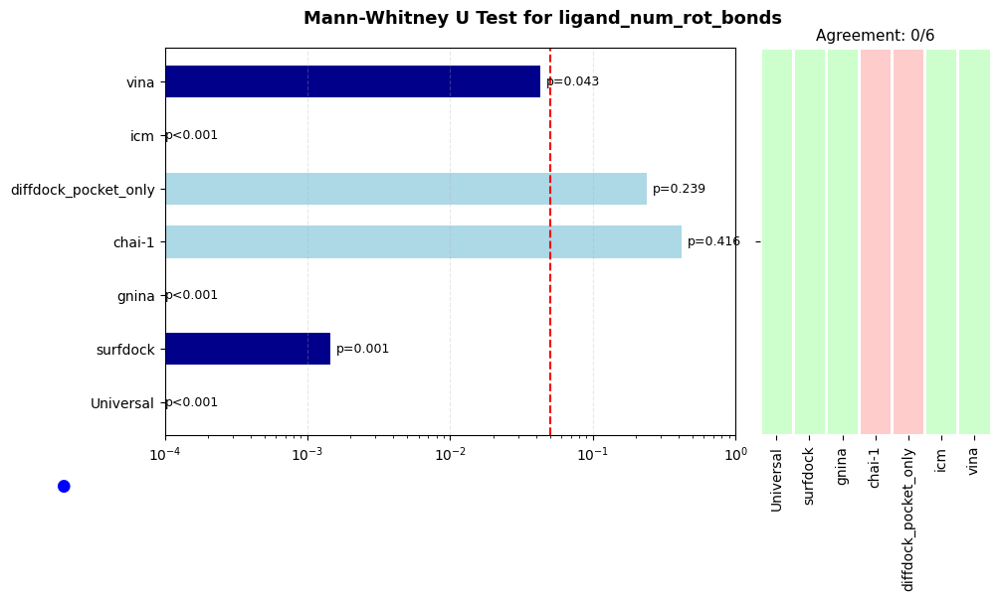

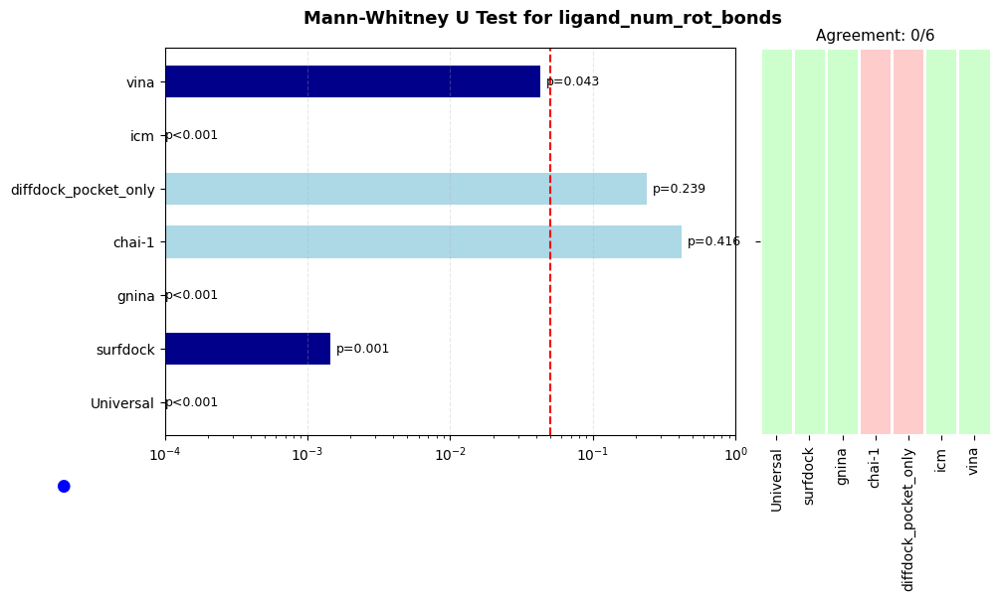

In [19]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_rot_bonds",
    property_type="continuous",
    plot=True  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_rot_bonds",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_rot_bonds",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_hbd

Analyzing ligand_num_hbd for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_hbd':
Success cases: n=90, mean=2.385, std=2.353
Failure cases: n=102, mean=7.667, std=1.265
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.846
Chi-square test for distribution: p=0.000000

Impact of ligand_num_hbd on Docking RMSD for surfdock
Pearson correlation: 0.0888, p-value: 0.120542
Spearman correlation: 0.1783, p-value: 0.001712


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


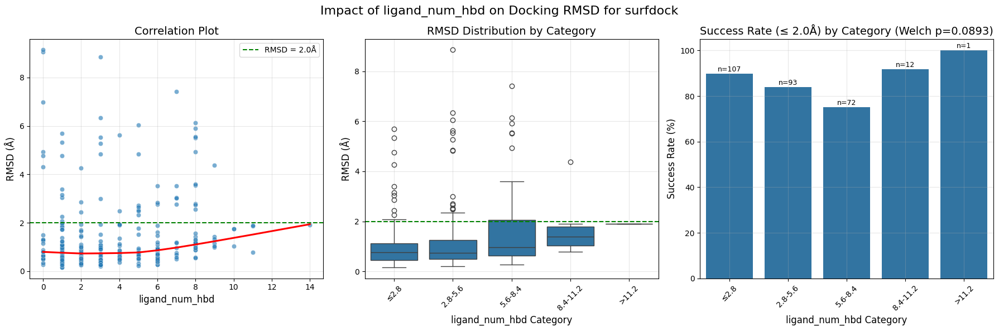


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate  mean_rmsd
0                    ≤2.8          107     89.719626   1.062150
1                 2.8-5.6           93     83.870968   1.332784
2                 5.6-8.4           72     75.000000   1.632239
3                8.4-11.2           12     91.666667   1.614473
4                   >11.2            1    100.000000   1.903425

ANOVA test: F=2.037, p=0.089346
Welch ANOVA p=0.089346 (used unbalanced‑sizes variant)
Kruskal–Wallis H=17.596, p=0.001480

Impact of ligand_num_hbd on Docking RMSD for gnina
Pearson correlation: 0.1302, p-value: 0.005155
Spearman correlation: 0.0703, p-value: 0.132163


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


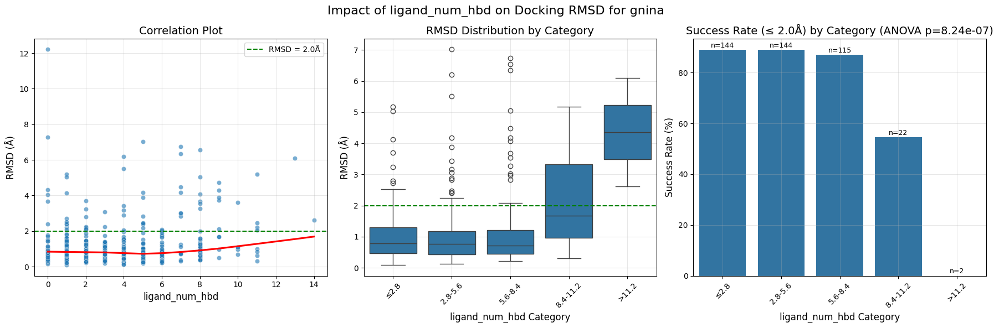


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate  mean_rmsd
0                    ≤2.8          144     88.888889   1.035628
1                 2.8-5.6          144     88.888889   1.057944
2                 5.6-8.4          115     86.956522   1.175504
3                8.4-11.2           22     54.545455   2.077401
4                   >11.2            2      0.000000   4.361854

ANOVA test: F=8.773, p=0.000001
Significant differences in RMSD across ligand_num_hbd categories
Welch ANOVA p=0.000001 (used unbalanced‑sizes variant)
Kruskal–Wallis H=19.030, p=0.000775

Impact of ligand_num_hbd on Docking RMSD for chai-1
Pearson correlation: 0.1200, p-value: 0.012369
Spearman correlation: 0.0438, p-value: 0.362583


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


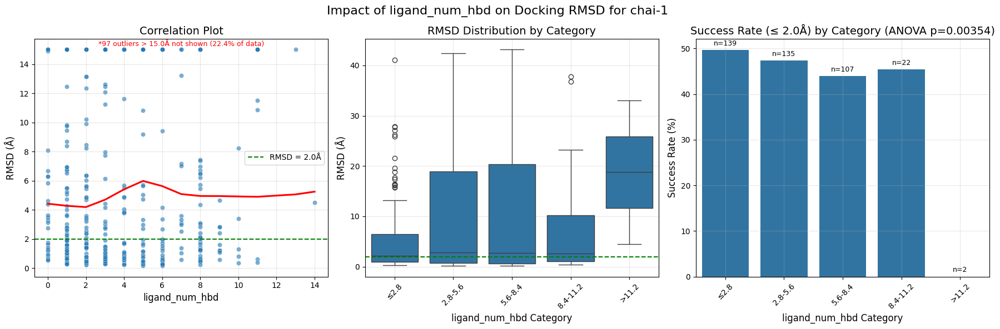


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate  mean_rmsd
0                    ≤2.8          139     49.640288   5.318327
1                 2.8-5.6          135     47.407407   9.558849
2                 5.6-8.4          107     43.925234   9.160313
3                8.4-11.2           22     45.454545   7.728502
4                   >11.2            2      0.000000  18.765206

ANOVA test: F=3.977, p=0.003542
Significant differences in RMSD across ligand_num_hbd categories
Welch ANOVA p=0.003542 (used unbalanced‑sizes variant)
Kruskal–Wallis H=3.766, p=0.438621

Impact of ligand_num_hbd on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.0219, p-value: 0.651062
Spearman correlation: -0.0611, p-value: 0.206292


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


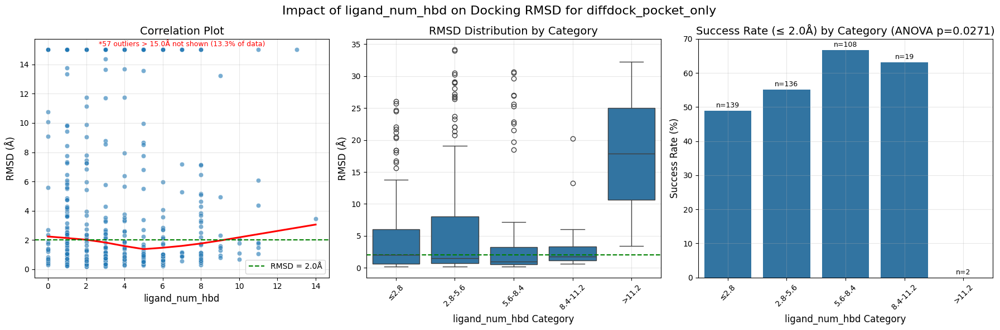


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate  mean_rmsd
0                    ≤2.8          139     48.920863   4.823334
1                 2.8-5.6          136     55.147059   6.346888
2                 5.6-8.4          108     66.666667   4.213181
3                8.4-11.2           19     63.157895   3.625907
4                   >11.2            2      0.000000  17.858432

ANOVA test: F=2.768, p=0.027132
Significant differences in RMSD across ligand_num_hbd categories
Welch ANOVA p=0.027132 (used unbalanced‑sizes variant)
Kruskal–Wallis H=10.359, p=0.034789

Impact of ligand_num_hbd on Docking RMSD for icm
Pearson correlation: 0.1839, p-value: 0.000087
Spearman correlation: 0.2086, p-value: 0.000008


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


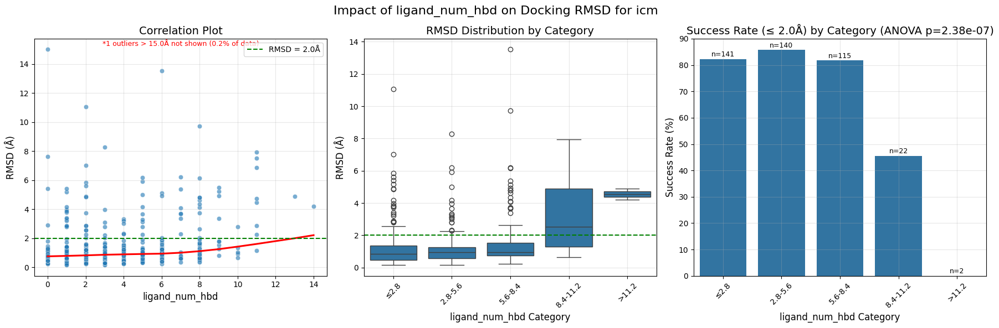


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate  mean_rmsd
0                    ≤2.8          141     82.269504   1.359403
1                 2.8-5.6          140     85.714286   1.249168
2                 5.6-8.4          115     81.739130   1.633195
3                8.4-11.2           22     45.454545   3.219930
4                   >11.2            2      0.000000   4.553498

ANOVA test: F=9.491, p=0.000000
Significant differences in RMSD across ligand_num_hbd categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=32.556, p=0.000001

Impact of ligand_num_hbd on Docking RMSD for vina
Pearson correlation: 0.1133, p-value: 0.062441
Spearman correlation: 0.1070, p-value: 0.078817


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


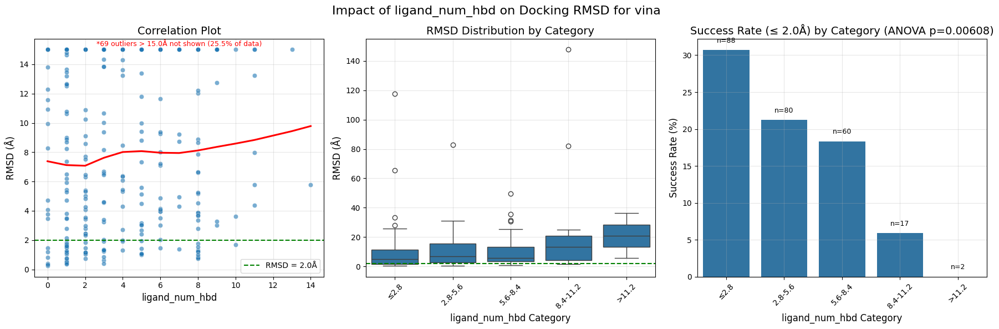


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate  mean_rmsd
0                    ≤2.8           88     30.681818   9.252803
1                 2.8-5.6           80     21.250000  10.925375
2                 5.6-8.4           60     18.333333   9.785442
3                8.4-11.2           17      5.882353  24.367770
4                   >11.2            2      0.000000  20.975948

ANOVA test: F=3.698, p=0.006083
Significant differences in RMSD across ligand_num_hbd categories
Welch ANOVA p=0.006083 (used unbalanced‑sizes variant)
Kruskal–Wallis H=11.089, p=0.025587


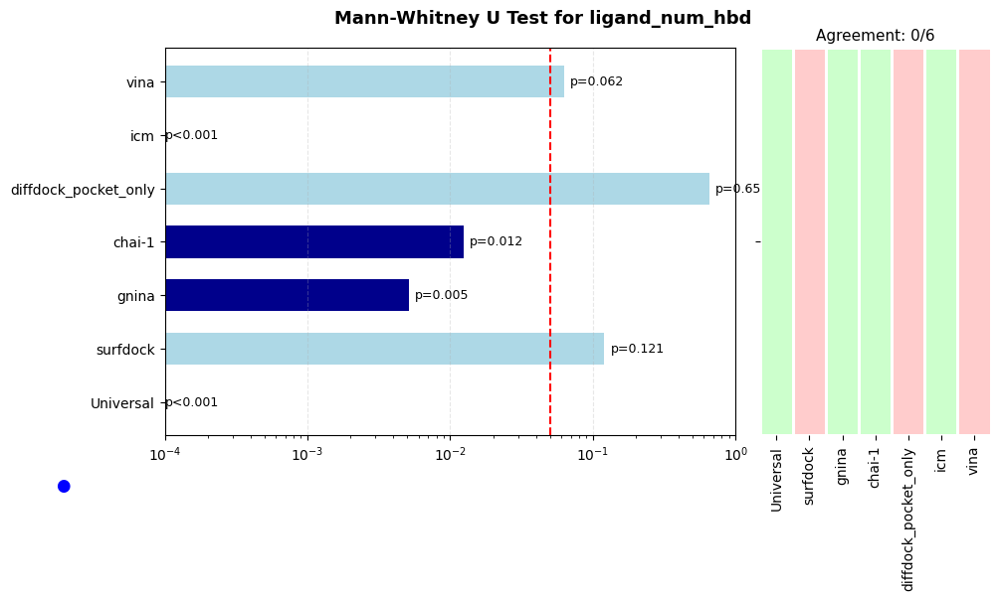

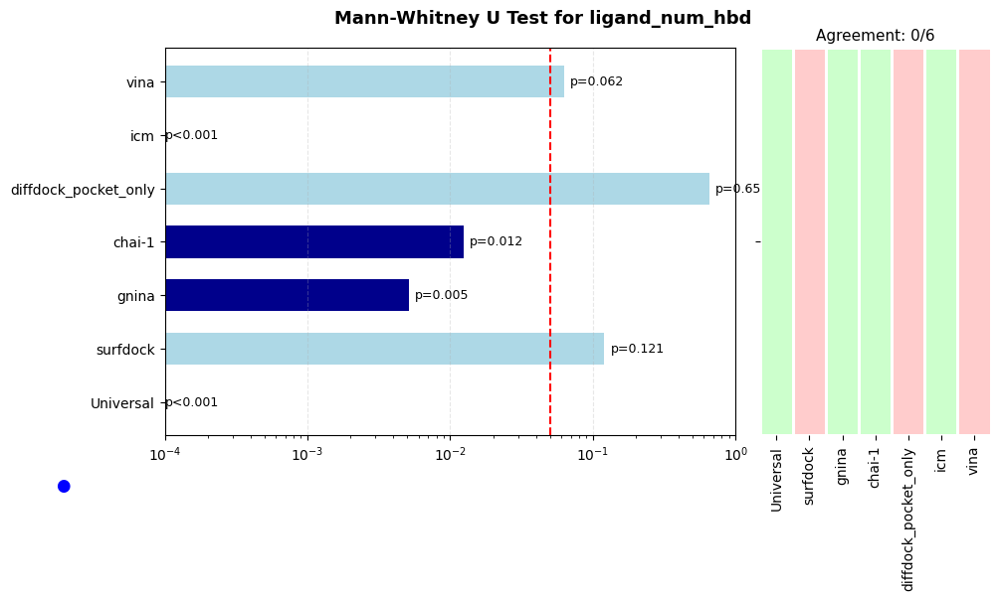

In [20]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_hbd",
    property_type="continuous",
    plot=True  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_hbd",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_hbd",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_hba

Analyzing ligand_num_hba for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_hba':
Success cases: n=90, mean=5.923, std=2.542
Failure cases: n=102, mean=8.333, std=1.821
Mann-Whitney U test: p=0.000001
Effect size (Cohen's d): 1.101
Chi-square test for distribution: p=0.002746

Impact of ligand_num_hba on Docking RMSD for surfdock
Pearson correlation: 0.0952, p-value: 0.095762
Spearman correlation: 0.2972, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


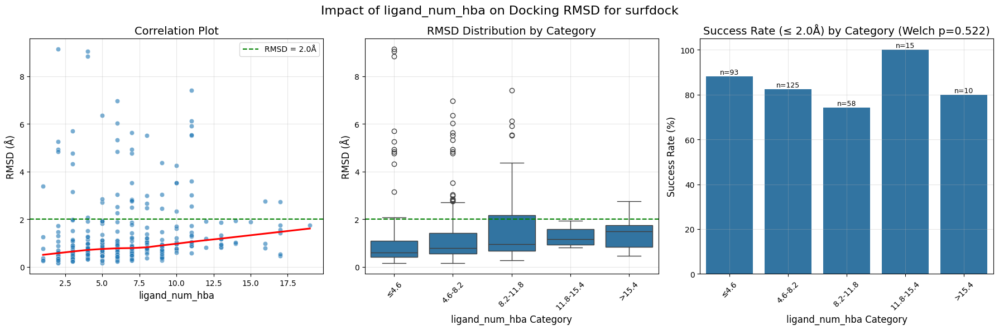


Success rates by category:
  ligand_num_hba_category  total_count  success_rate  mean_rmsd
0                    ≤4.6           93     88.172043   1.281709
1                 4.6-8.2          125     82.400000   1.357168
2                8.2-11.8           58     74.137931   1.721469
3               11.8-15.4           15    100.000000   1.255490
4                   >15.4           10     80.000000   1.477836

ANOVA test: F=0.806, p=0.521944
Welch ANOVA p=0.521944 (used unbalanced‑sizes variant)
Kruskal–Wallis H=20.245, p=0.000447

Impact of ligand_num_hba on Docking RMSD for gnina
Pearson correlation: 0.1023, p-value: 0.028207
Spearman correlation: 0.0917, p-value: 0.049347


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


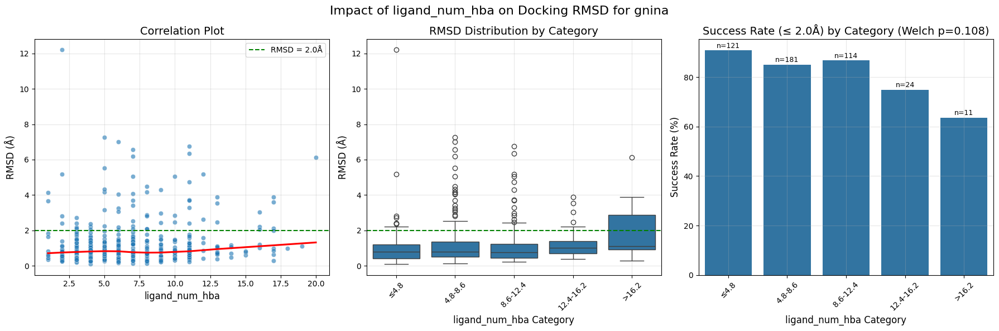


Success rates by category:
  ligand_num_hba_category  total_count  success_rate  mean_rmsd
0                    ≤4.8          121     90.909091   1.028321
1                 4.8-8.6          181     85.082873   1.232273
2                8.6-12.4          114     86.842105   1.148984
3               12.4-16.2           24     75.000000   1.335675
4                   >16.2           11     63.636364   2.052184

ANOVA test: F=1.909, p=0.107816
Welch ANOVA p=0.107816 (used unbalanced‑sizes variant)
Kruskal–Wallis H=9.836, p=0.043281

Impact of ligand_num_hba on Docking RMSD for chai-1
Pearson correlation: 0.1087, p-value: 0.023569
Spearman correlation: 0.0618, p-value: 0.198496


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


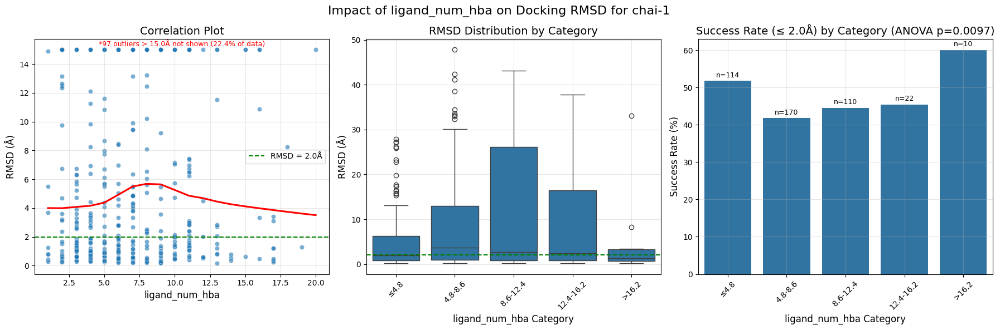


Success rates by category:
  ligand_num_hba_category  total_count  success_rate  mean_rmsd
0                    ≤4.8          114     51.754386   5.276761
1                 4.8-8.6          170     41.764706   8.718920
2                8.6-12.4          110     44.545455   9.960349
3               12.4-16.2           22     45.454545   9.687079
4                   >16.2           10     60.000000   5.258196

ANOVA test: F=3.382, p=0.009699
Significant differences in RMSD across ligand_num_hba categories
Welch ANOVA p=0.009699 (used unbalanced‑sizes variant)
Kruskal–Wallis H=5.080, p=0.279158

Impact of ligand_num_hba on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.0707, p-value: 0.143201
Spearman correlation: -0.0636, p-value: 0.188219


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


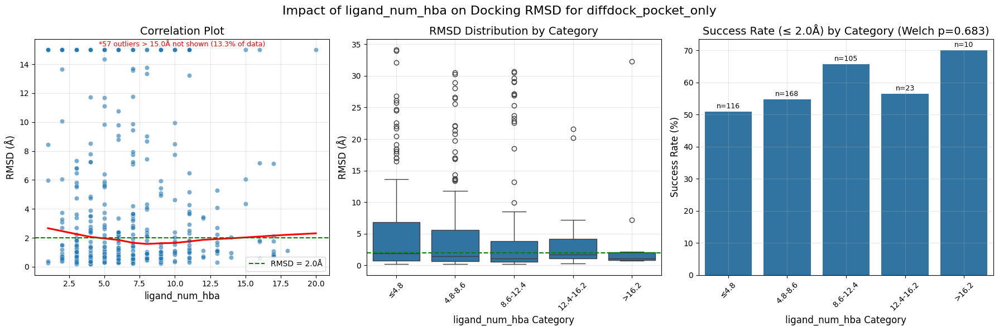


Success rates by category:
  ligand_num_hba_category  total_count  success_rate  mean_rmsd
0                    ≤4.8          116     50.862069   5.981702
1                 4.8-8.6          168     54.761905   4.760906
2                8.6-12.4          105     65.714286   5.072140
3               12.4-16.2           23     56.521739   3.925894
4                   >16.2           10     70.000000   4.875050

ANOVA test: F=0.572, p=0.682766
Welch ANOVA p=0.682766 (used unbalanced‑sizes variant)
Kruskal–Wallis H=4.339, p=0.362012

Impact of ligand_num_hba on Docking RMSD for icm
Pearson correlation: 0.1305, p-value: 0.005570
Spearman correlation: 0.1462, p-value: 0.001872


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


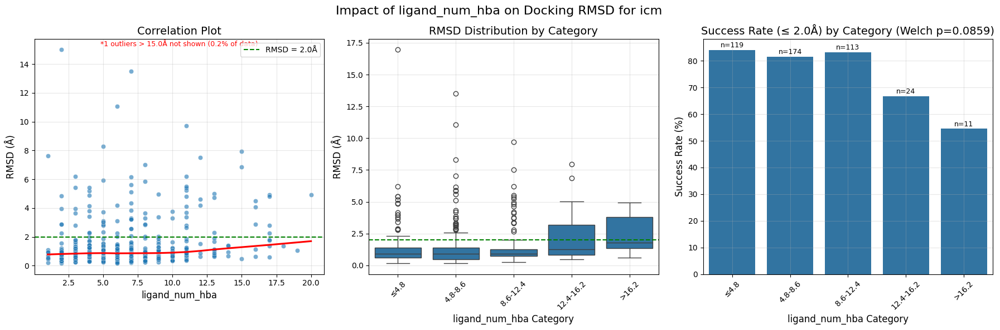


Success rates by category:
  ligand_num_hba_category  total_count  success_rate  mean_rmsd
0                    ≤4.8          119     84.033613   1.455095
1                 4.8-8.6          174     81.609195   1.432117
2                8.6-12.4          113     83.185841   1.507095
3               12.4-16.2           24     66.666667   2.278034
4                   >16.2           11     54.545455   2.511546

ANOVA test: F=2.054, p=0.085945
Welch ANOVA p=0.085945 (used unbalanced‑sizes variant)
Kruskal–Wallis H=18.092, p=0.001184

Impact of ligand_num_hba on Docking RMSD for vina
Pearson correlation: 0.1089, p-value: 0.073368
Spearman correlation: 0.1057, p-value: 0.082417


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


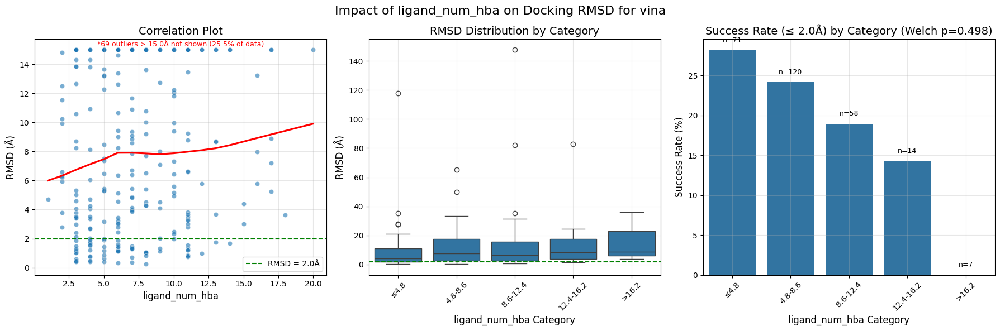


Success rates by category:
  ligand_num_hba_category  total_count  success_rate  mean_rmsd
0                    ≤4.8           71     28.169014   8.850662
1                 4.8-8.6          120     24.166667  11.111909
2                8.6-12.4           58     18.965517  12.763717
3               12.4-16.2           14     14.285714  14.644504
4                   >16.2            7      0.000000  15.302794

ANOVA test: F=0.845, p=0.497719
Welch ANOVA p=0.497719 (used unbalanced‑sizes variant)
Kruskal–Wallis H=8.474, p=0.075679


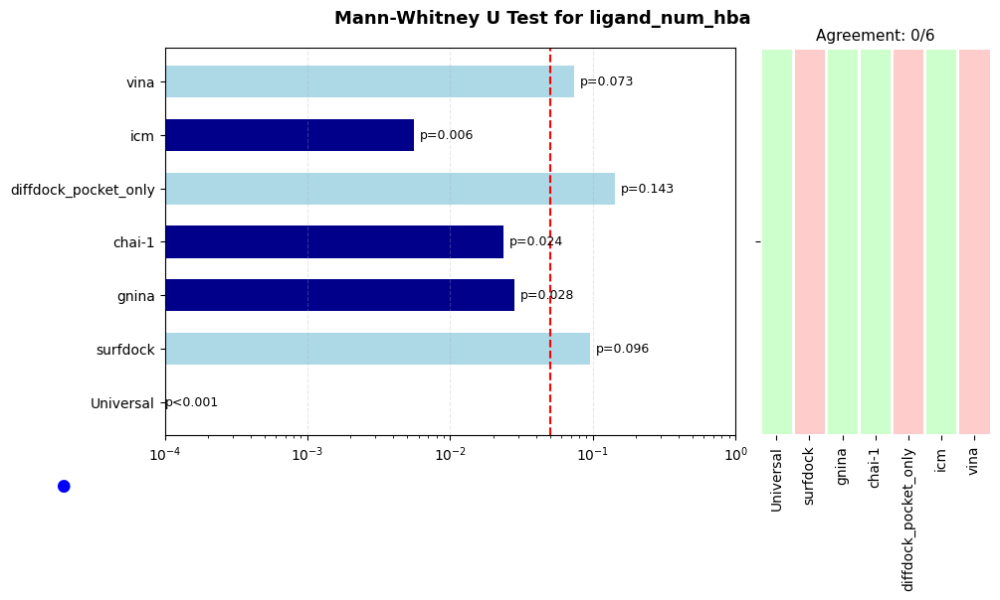

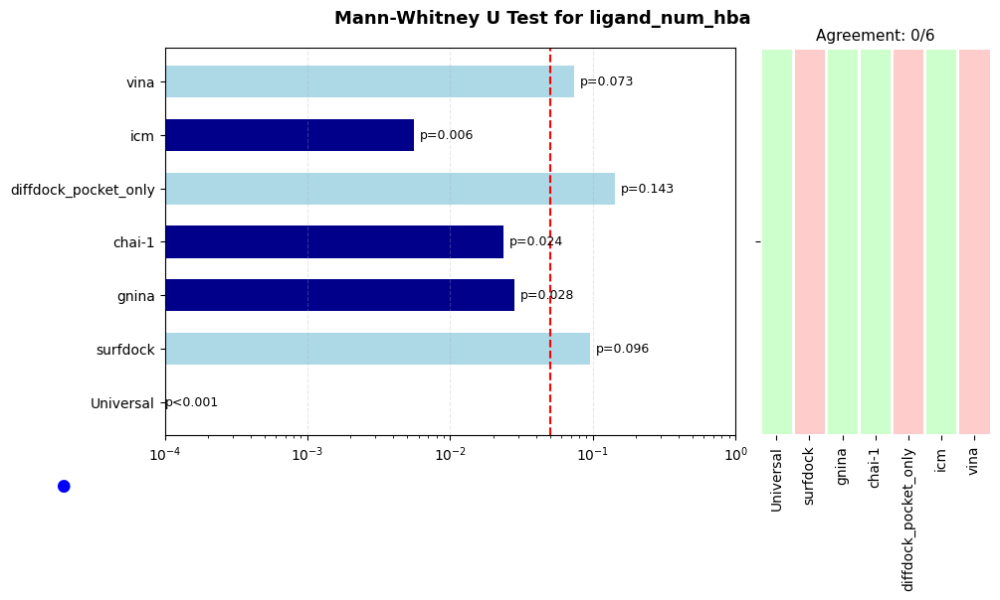

In [11]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_hba",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_hba",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_hba",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_rings

Analyzing ligand_num_rings for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_rings':
Success cases: n=90, mean=3.077, std=1.394
Failure cases: n=102, mean=1.000, std=0.828
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.840
Chi-square test for distribution: p=0.000009

Impact of ligand_num_rings on Docking RMSD for surfdock
Pearson correlation: -0.0169, p-value: 0.767772
Spearman correlation: 0.0728, p-value: 0.203627


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


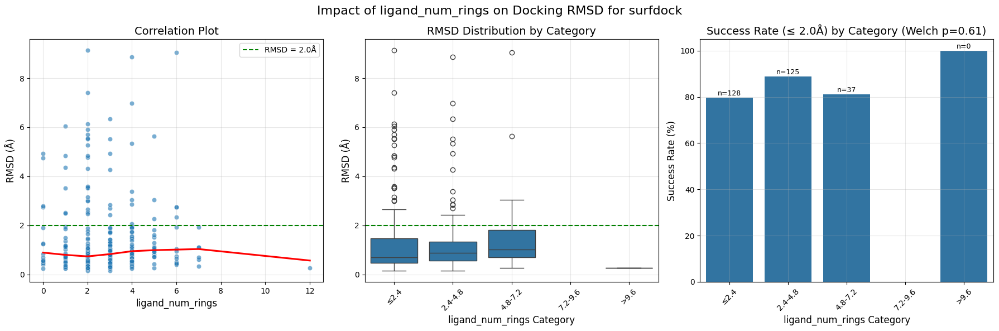


Success rates by category:
  ligand_num_rings_category  total_count  success_rate  mean_rmsd
0                      ≤2.4          128     79.687500   1.473327
1                   2.4-4.8          125     88.800000   1.272805
2                   4.8-7.2           37     81.081081   1.517226
3                   7.2-9.6            0           NaN        NaN
4                      >9.6            1    100.000000   0.269246

ANOVA test: F=0.608, p=0.610088
Welch ANOVA p=0.610088 (used unbalanced‑sizes variant)
Kruskal–Wallis H=6.255, p=0.099856

Impact of ligand_num_rings on Docking RMSD for gnina
Pearson correlation: -0.1477, p-value: 0.001494
Spearman correlation: -0.0958, p-value: 0.040081


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


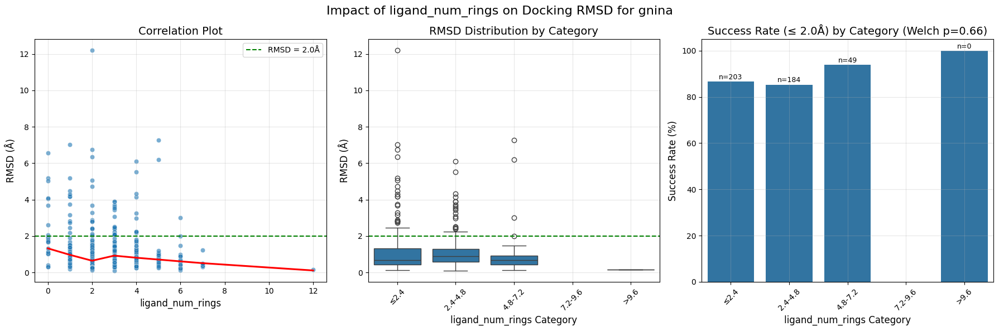


Success rates by category:
  ligand_num_rings_category  total_count  success_rate  mean_rmsd
0                      ≤2.4          203     86.699507   1.151232
1                   2.4-4.8          184     85.326087   1.163274
2                   4.8-7.2           49     93.877551   0.973095
3                   7.2-9.6            0           NaN        NaN
4                      >9.6            1    100.000000   0.165846

ANOVA test: F=0.532, p=0.660219
Welch ANOVA p=0.660219 (used unbalanced‑sizes variant)
Kruskal–Wallis H=14.403, p=0.002405

Impact of ligand_num_rings on Docking RMSD for chai-1
Pearson correlation: -0.1337, p-value: 0.005259
Spearman correlation: -0.0672, p-value: 0.161988


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


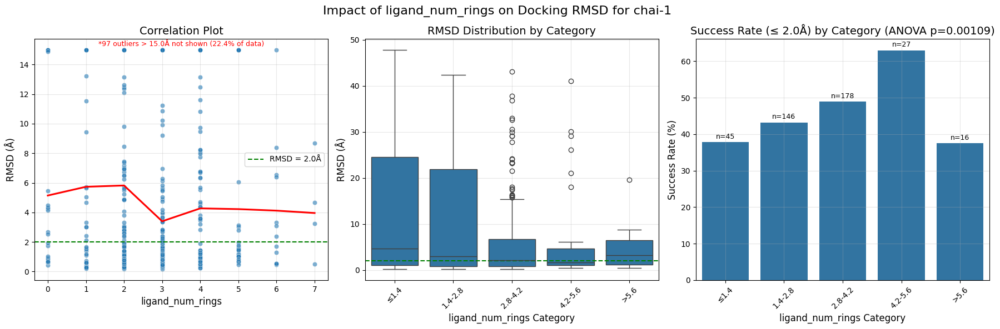


Success rates by category:
  ligand_num_rings_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           45     37.777778  11.985073
1                   1.4-2.8          146     43.150685   9.746702
2                   2.8-4.2          178     48.876404   6.080829
3                   4.2-5.6           27     62.962963   7.427126
4                      >5.6           16     37.500000   4.459838

ANOVA test: F=4.659, p=0.001094
Significant differences in RMSD across ligand_num_rings categories
Welch ANOVA p=0.001094 (used unbalanced‑sizes variant)
Kruskal–Wallis H=4.852, p=0.302805

Impact of ligand_num_rings on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.0150, p-value: 0.756211
Spearman correlation: 0.0295, p-value: 0.541279


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


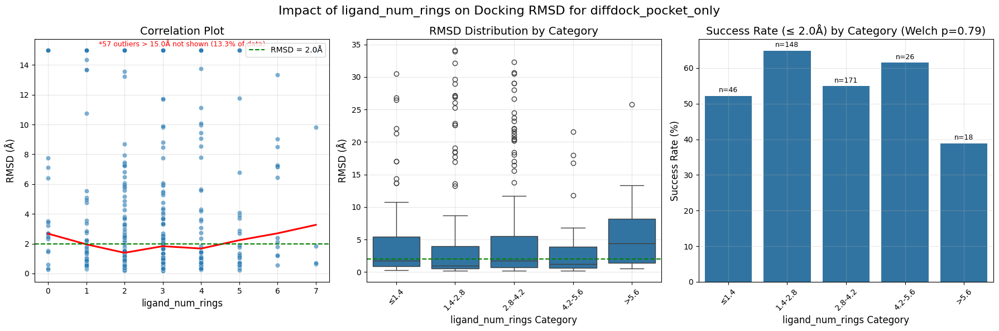


Success rates by category:
  ligand_num_rings_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           46     52.173913   5.990297
1                   1.4-2.8          148     64.864865   4.707148
2                   2.8-4.2          171     54.970760   5.281099
3                   4.2-5.6           26     61.538462   4.098929
4                      >5.6           18     38.888889   5.947634

ANOVA test: F=0.426, p=0.790100
Welch ANOVA p=0.790100 (used unbalanced‑sizes variant)
Kruskal–Wallis H=11.725, p=0.019519

Impact of ligand_num_rings on Docking RMSD for icm
Pearson correlation: -0.1155, p-value: 0.014187
Spearman correlation: -0.1582, p-value: 0.000758


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


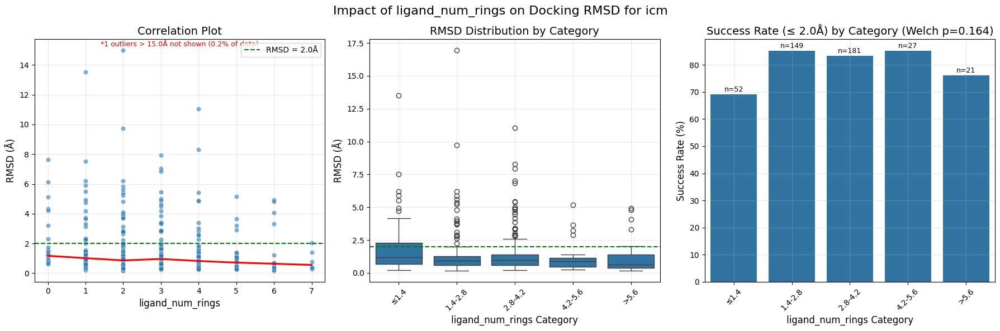


Success rates by category:
  ligand_num_rings_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           52     69.230769   2.062654
1                   1.4-2.8          149     85.234899   1.420589
2                   2.8-4.2          181     83.425414   1.444286
3                   4.2-5.6           27     85.185185   1.202743
4                      >5.6           21     76.190476   1.336069

ANOVA test: F=1.635, p=0.164480
Welch ANOVA p=0.164480 (used unbalanced‑sizes variant)
Kruskal–Wallis H=8.858, p=0.064749

Impact of ligand_num_rings on Docking RMSD for vina
Pearson correlation: 0.0152, p-value: 0.803357
Spearman correlation: -0.0058, p-value: 0.924586


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


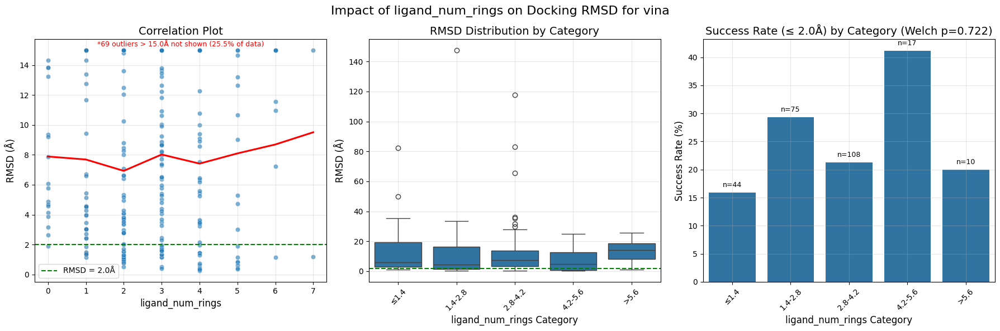


Success rates by category:
  ligand_num_rings_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           44     15.909091  13.003005
1                   1.4-2.8           75     29.333333  10.585070
2                   2.8-4.2          108     21.296296  11.837557
3                   4.2-5.6           17     41.176471   7.063317
4                      >5.6           10     20.000000  13.096456

ANOVA test: F=0.518, p=0.722425
Welch ANOVA p=0.722425 (used unbalanced‑sizes variant)
Kruskal–Wallis H=7.173, p=0.127017


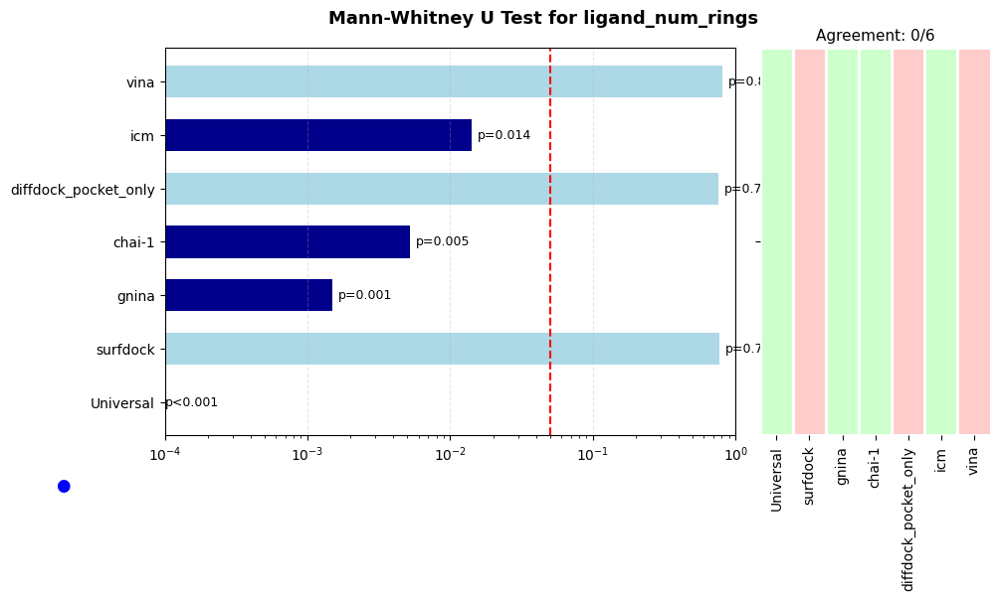

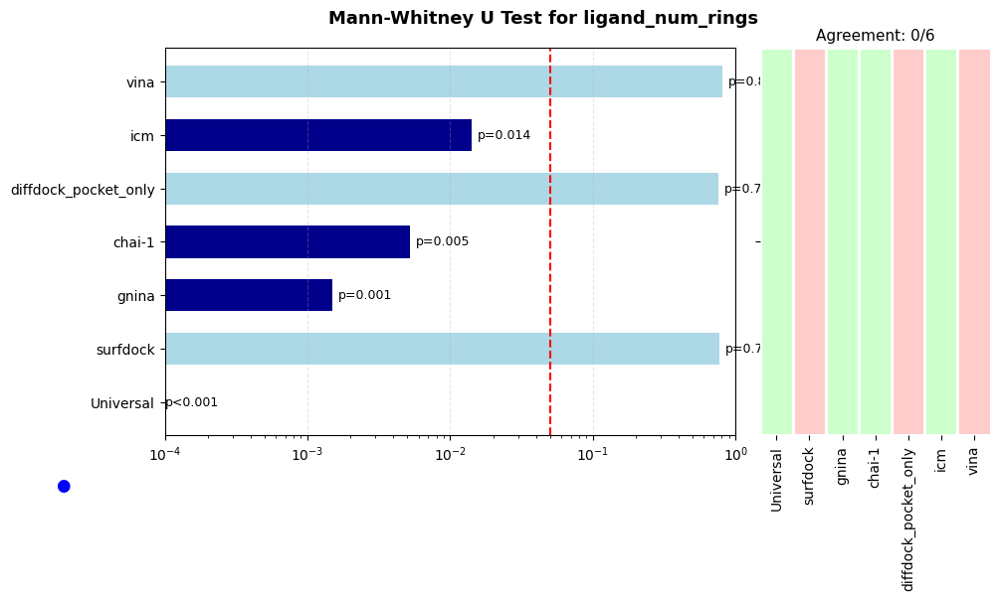

In [12]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_rings",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_rings",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_rings",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### entry_resolution

Analyzing entry_resolution for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'entry_resolution':
Success cases: n=90, mean=2.186, std=0.359
Failure cases: n=102, mean=2.400, std=0.437
Mann-Whitney U test: p=0.008382
Effect size (Cohen's d): 0.531

Impact of entry_resolution on Docking RMSD for surfdock
Pearson correlation: 0.0162, p-value: 0.776765
Spearman correlation: 0.0926, p-value: 0.105530


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


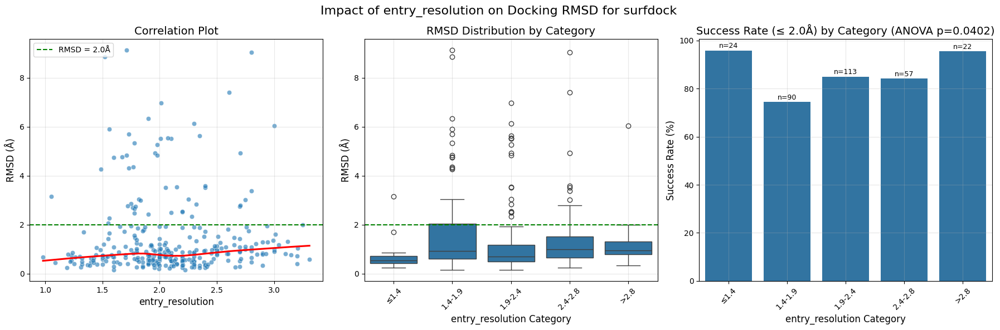


Success rates by category:
  entry_resolution_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           24     95.833333   0.698314
1                   1.4-1.9           90     74.444444   1.723250
2                   1.9-2.4          113     84.955752   1.266647
3                   2.4-2.8           57     84.210526   1.493710
4                      >2.8           22     95.454545   1.264433

ANOVA test: F=2.537, p=0.040203
Significant differences in RMSD across entry_resolution categories
Welch ANOVA p=0.040203 (used unbalanced‑sizes variant)
Kruskal–Wallis H=21.417, p=0.000262

Impact of entry_resolution on Docking RMSD for gnina
Pearson correlation: 0.1060, p-value: 0.022974
Spearman correlation: 0.1614, p-value: 0.000512


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


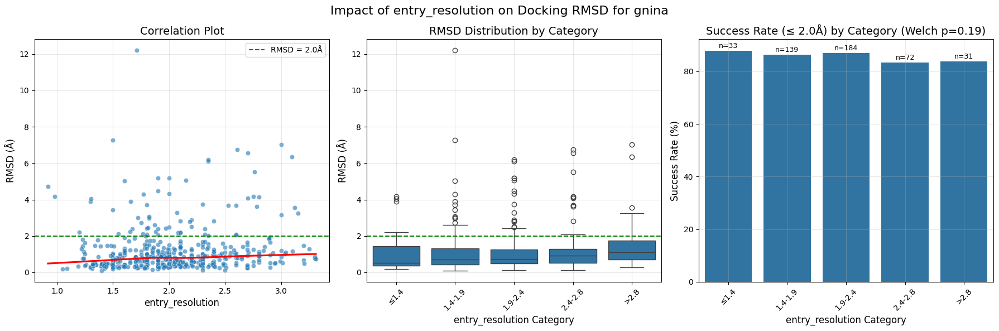


Success rates by category:
  entry_resolution_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           33     87.878788   1.084713
1                   1.4-1.9          139     86.330935   1.147763
2                   1.9-2.4          184     86.956522   1.086561
3                   2.4-2.8           72     83.333333   1.352230
4                      >2.8           31     83.870968   1.607637

ANOVA test: F=1.537, p=0.190397
Welch ANOVA p=0.190397 (used unbalanced‑sizes variant)
Kruskal–Wallis H=9.835, p=0.043301

Impact of entry_resolution on Docking RMSD for chai-1
Pearson correlation: -0.1087, p-value: 0.023526
Spearman correlation: -0.0006, p-value: 0.989642


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


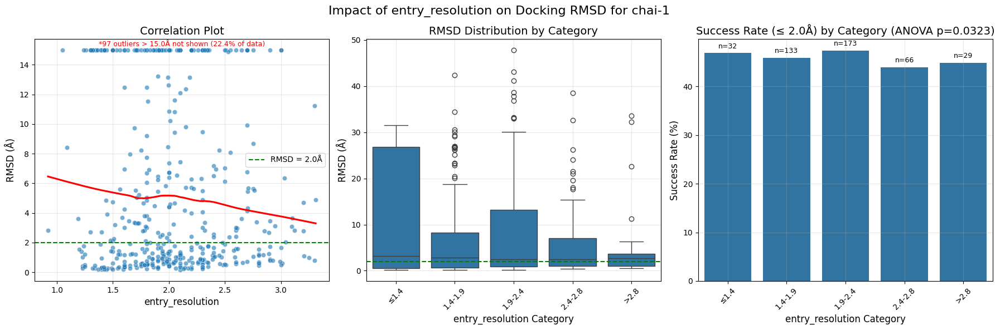


Success rates by category:
  entry_resolution_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           32     46.875000  12.537707
1                   1.4-1.9          133     45.864662   7.532308
2                   1.9-2.4          173     47.398844   8.664428
3                   2.4-2.8           66     43.939394   6.256252
4                      >2.8           29     44.827586   5.347295

ANOVA test: F=2.660, p=0.032321
Significant differences in RMSD across entry_resolution categories
Welch ANOVA p=0.032321 (used unbalanced‑sizes variant)
Kruskal–Wallis H=2.108, p=0.715881

Impact of entry_resolution on Docking RMSD for diffdock_pocket_only
Pearson correlation: 0.1388, p-value: 0.003923
Spearman correlation: 0.1843, p-value: 0.000122


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


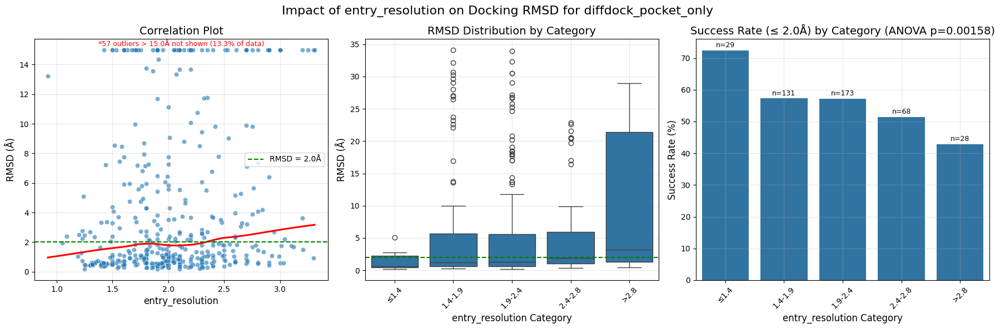


Success rates by category:
  entry_resolution_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           29     72.413793   1.284571
1                   1.4-1.9          131     57.251908   5.236654
2                   1.9-2.4          173     57.225434   5.191057
3                   2.4-2.8           68     51.470588   5.076847
4                      >2.8           28     42.857143   9.940345

ANOVA test: F=4.443, p=0.001581
Significant differences in RMSD across entry_resolution categories
Welch ANOVA p=0.001581 (used unbalanced‑sizes variant)
Kruskal–Wallis H=20.366, p=0.000423

Impact of entry_resolution on Docking RMSD for icm
Pearson correlation: 0.0340, p-value: 0.471865
Spearman correlation: 0.0361, p-value: 0.444901


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


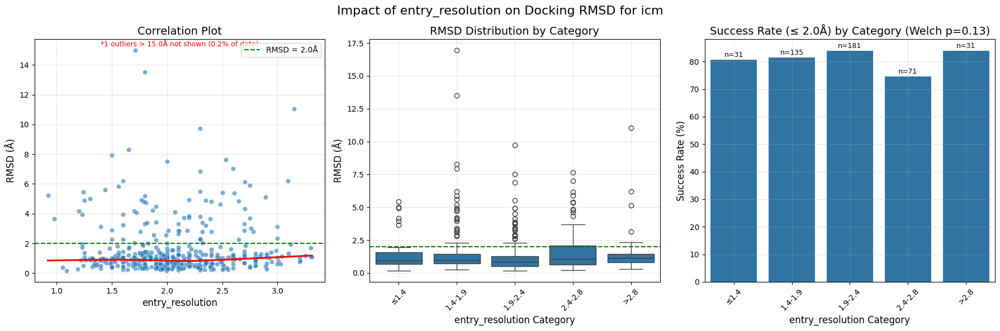


Success rates by category:
  entry_resolution_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           31     80.645161   1.578503
1                   1.4-1.9          135     81.481481   1.678546
2                   1.9-2.4          181     83.977901   1.250783
3                   2.4-2.8           71     74.647887   1.769496
4                      >2.8           31     83.870968   1.779625

ANOVA test: F=1.788, p=0.130079
Welch ANOVA p=0.130079 (used unbalanced‑sizes variant)
Kruskal–Wallis H=13.220, p=0.010251

Impact of entry_resolution on Docking RMSD for vina
Pearson correlation: 0.2353, p-value: 0.000092
Spearman correlation: 0.1441, p-value: 0.017635


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


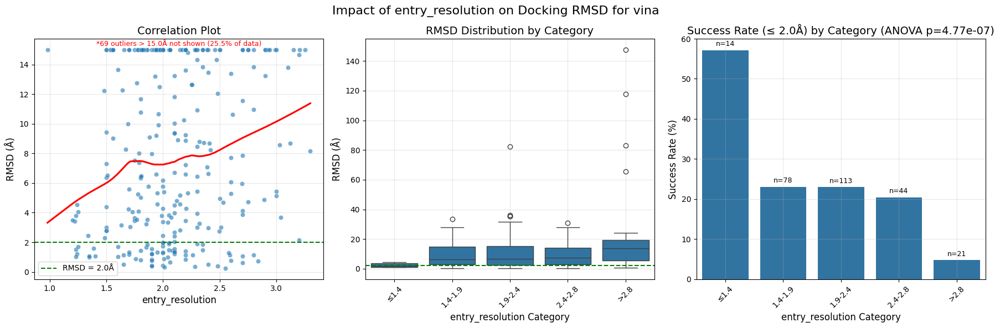


Success rates by category:
  entry_resolution_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           14     57.142857   2.284625
1                   1.4-1.9           78     23.076923   9.334006
2                   1.9-2.4          113     23.008850  10.480587
3                   2.4-2.8           44     20.454545   9.689251
4                      >2.8           21      4.761905  28.501991

ANOVA test: F=9.301, p=0.000000
Significant differences in RMSD across entry_resolution categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=20.102, p=0.000477


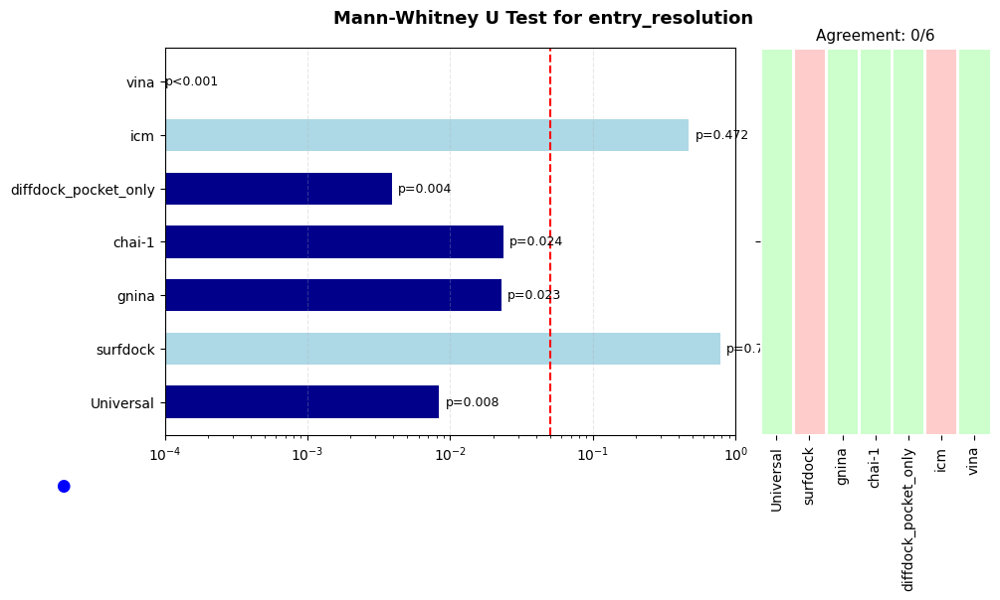

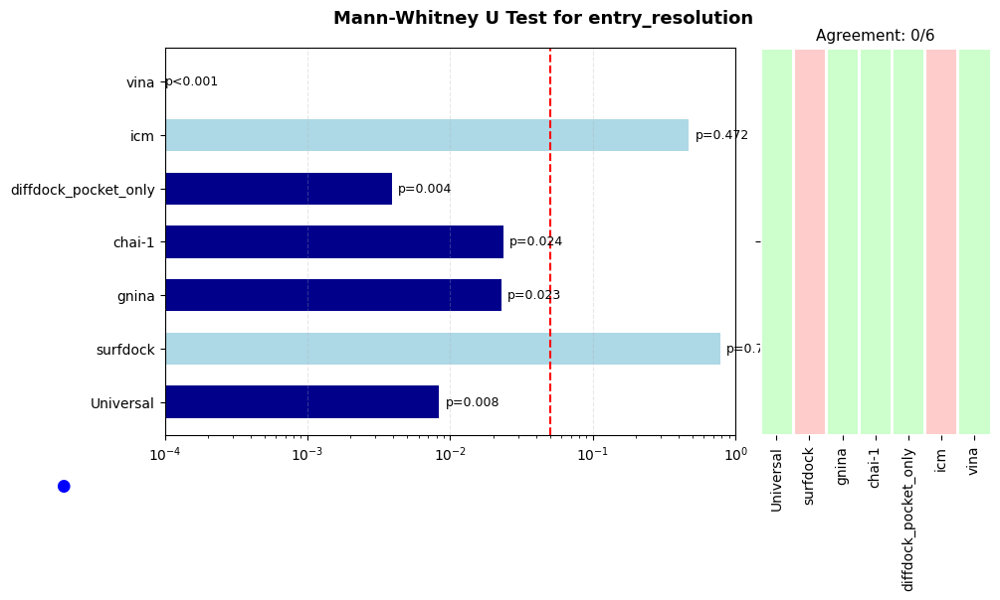

In [13]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="entry_resolution",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="entry_resolution",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="entry_resolution",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### entry_validation_molprobity

Analyzing entry_validation_molprobity for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'entry_validation_molprobity':
Success cases: n=90, mean=1.432, std=0.452
Failure cases: n=102, mean=1.715, std=0.573
Mann-Whitney U test: p=0.048203
Effect size (Cohen's d): 0.543

Impact of entry_validation_molprobity on Docking RMSD for surfdock
Pearson correlation: 0.0075, p-value: 0.895824
Spearman correlation: -0.0079, p-value: 0.891027


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


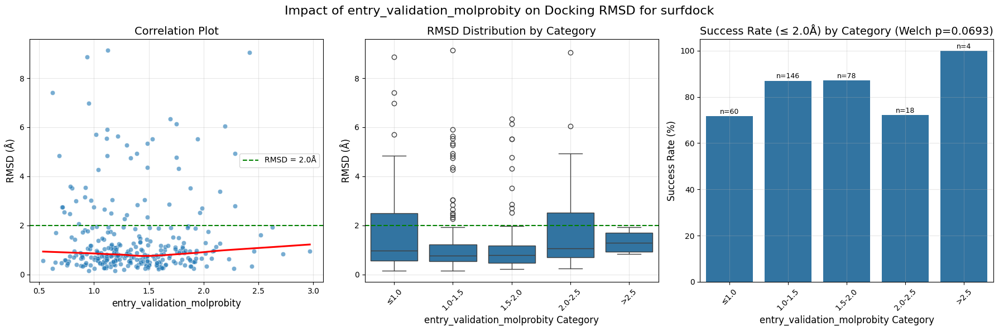


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate  mean_rmsd
0                                 ≤1.0           60     71.666667   1.750355
1                              1.0-1.5          146     86.986301   1.244381
2                              1.5-2.0           78     87.179487   1.261250
3                              2.0-2.5           18     72.222222   2.090122
4                                 >2.5            4    100.000000   1.338730

ANOVA test: F=2.197, p=0.069284
Welch ANOVA p=0.069284 (used unbalanced‑sizes variant)
Kruskal–Wallis H=7.284, p=0.121605

Impact of entry_validation_molprobity on Docking RMSD for gnina
Pearson correlation: 0.0748, p-value: 0.109101
Spearman correlation: 0.1206, p-value: 0.009621


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


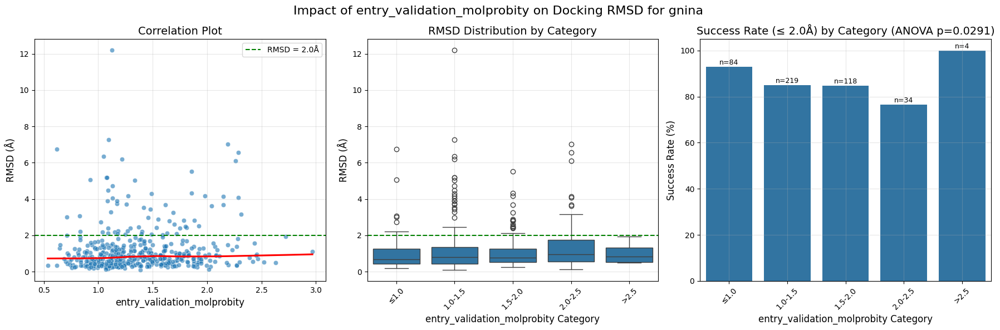


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate  mean_rmsd
0                                 ≤1.0           84     92.857143   0.982063
1                              1.0-1.5          219     84.931507   1.229232
2                              1.5-2.0          118     84.745763   1.101373
3                              2.0-2.5           34     76.470588   1.797524
4                                 >2.5            4    100.000000   1.019710

ANOVA test: F=2.723, p=0.029056
Significant differences in RMSD across entry_validation_molprobity categories
Welch ANOVA p=0.029056 (used unbalanced‑sizes variant)
Kruskal–Wallis H=6.410, p=0.170559

Impact of entry_validation_molprobity on Docking RMSD for chai-1
Pearson correlation: 0.0425, p-value: 0.377294
Spearman correlation: 0.0927, p-value: 0.053725


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


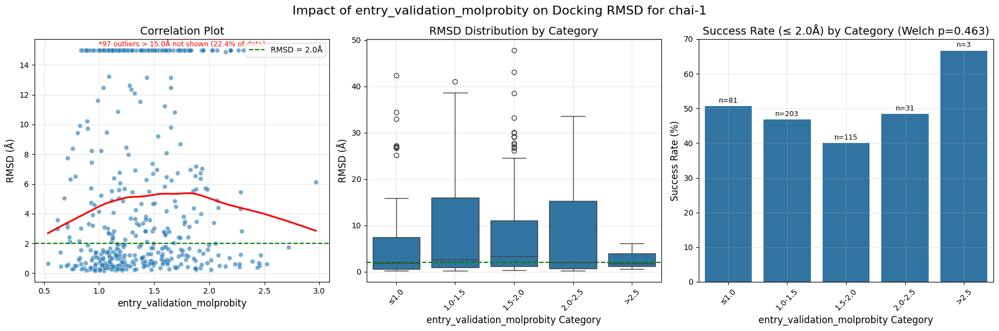


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate  mean_rmsd
0                                 ≤1.0           81     50.617284   6.269767
1                              1.0-1.5          203     46.798030   8.442110
2                              1.5-2.0          115     40.000000   8.443868
3                              2.0-2.5           31     48.387097   8.742078
4                                 >2.5            3     66.666667   2.819877

ANOVA test: F=0.901, p=0.463166
Welch ANOVA p=0.463166 (used unbalanced‑sizes variant)
Kruskal–Wallis H=5.730, p=0.220273

Impact of entry_validation_molprobity on Docking RMSD for diffdock_pocket_only
Pearson correlation: 0.1114, p-value: 0.020856
Spearman correlation: 0.1281, p-value: 0.007820


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


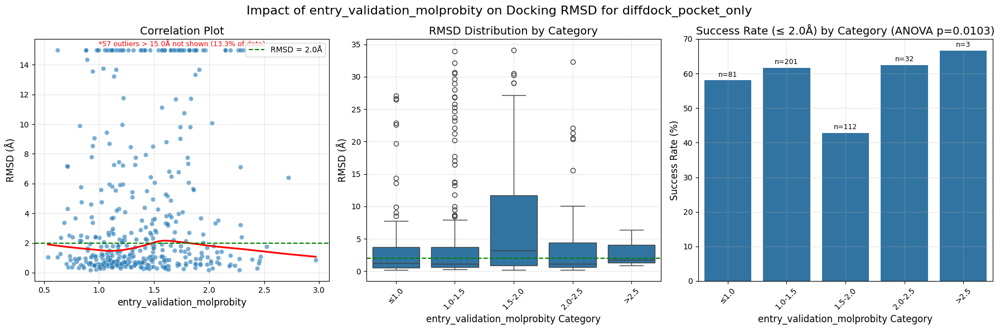


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate  mean_rmsd
0                                 ≤1.0           81     58.024691   4.039975
1                              1.0-1.5          201     61.691542   4.491580
2                              1.5-2.0          112     42.857143   7.499487
3                              2.0-2.5           32     62.500000   5.563402
4                                 >2.5            3     66.666667   3.005810

ANOVA test: F=3.347, p=0.010279
Significant differences in RMSD across entry_validation_molprobity categories
Welch ANOVA p=0.010279 (used unbalanced‑sizes variant)
Kruskal–Wallis H=13.083, p=0.010877

Impact of entry_validation_molprobity on Docking RMSD for icm
Pearson correlation: 0.0244, p-value: 0.605704
Spearman correlation: 0.0047, p-value: 0.920281


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


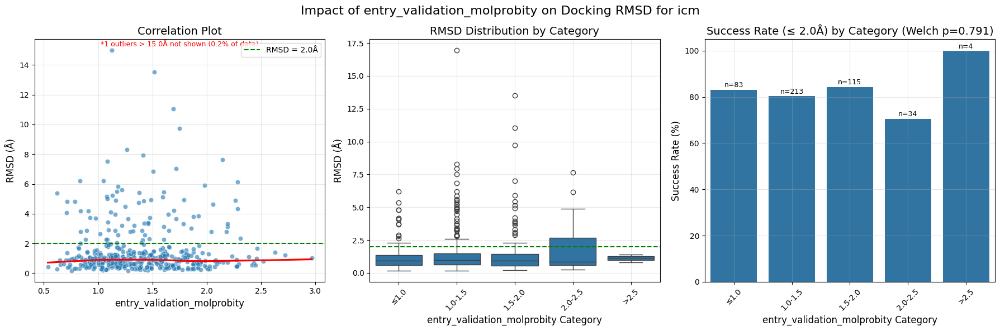


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate  mean_rmsd
0                                 ≤1.0           83     83.132530   1.344864
1                              1.0-1.5          213     80.281690   1.561910
2                              1.5-2.0          115     84.347826   1.556053
3                              2.0-2.5           34     70.588235   1.758553
4                                 >2.5            4    100.000000   1.117446

ANOVA test: F=0.424, p=0.791468
Welch ANOVA p=0.791468 (used unbalanced‑sizes variant)
Kruskal–Wallis H=1.152, p=0.885869

Impact of entry_validation_molprobity on Docking RMSD for vina
Pearson correlation: -0.0029, p-value: 0.962575
Spearman correlation: 0.0157, p-value: 0.797570


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


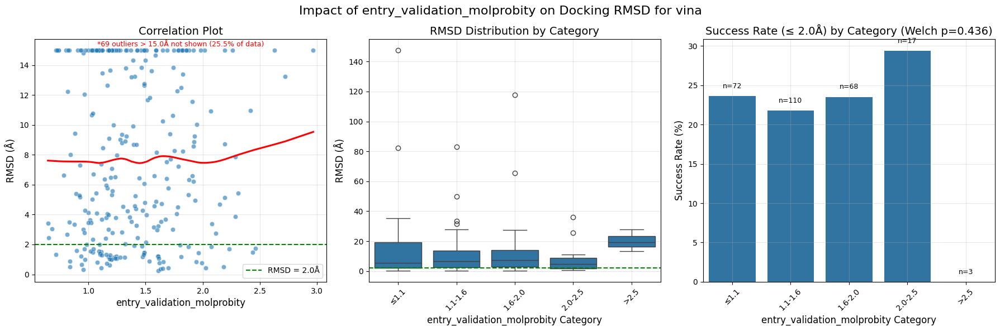


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate  mean_rmsd
0                                 ≤1.1           72     23.611111  13.331534
1                              1.1-1.6          110     21.818182  10.010590
2                              1.6-2.0           68     23.529412  11.197317
3                              2.0-2.5           17     29.411765   7.807729
4                                 >2.5            3      0.000000  20.122884

ANOVA test: F=0.949, p=0.436295
Welch ANOVA p=0.436295 (used unbalanced‑sizes variant)
Kruskal–Wallis H=4.835, p=0.304628


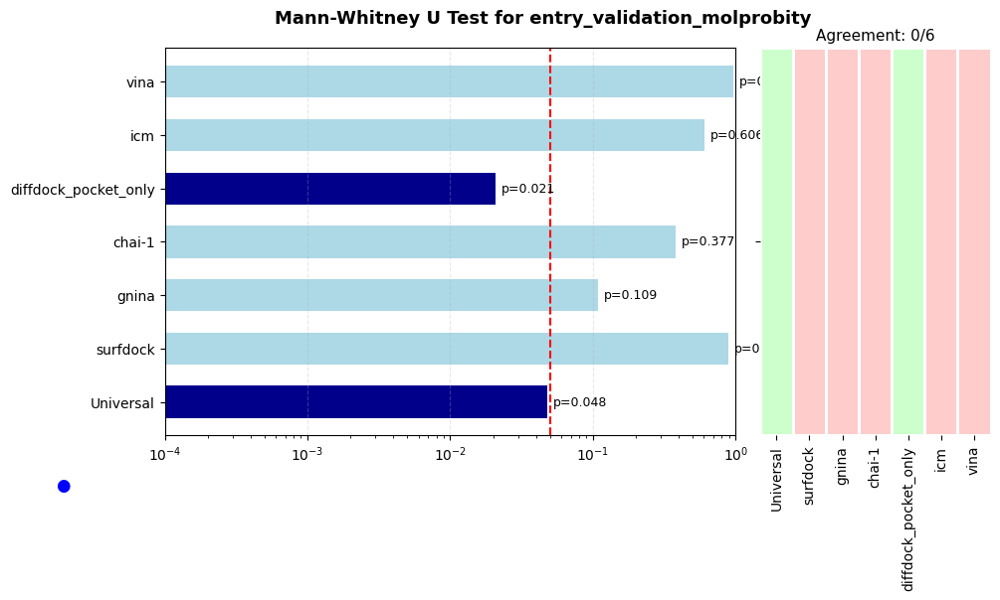

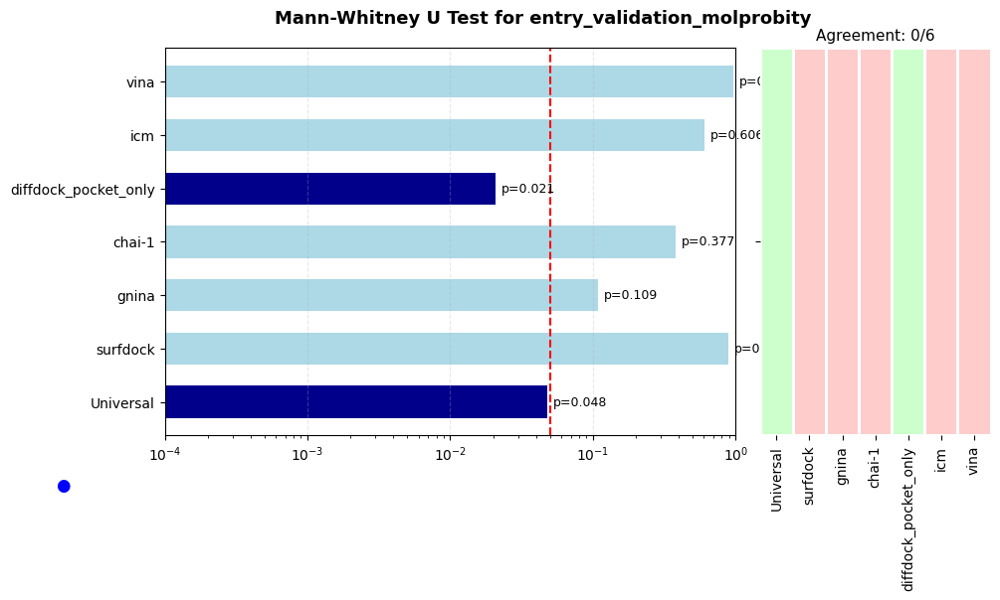

In [14]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="entry_validation_molprobity",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="entry_validation_molprobity",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="entry_validation_molprobity",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### system_num_pocket_residues

Analyzing system_num_pocket_residues for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'system_num_pocket_residues':
Success cases: n=90, mean=27.231, std=6.896
Failure cases: n=102, mean=16.000, std=2.619
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.206
Chi-square test for distribution: p=0.000000

Impact of system_num_pocket_residues on Docking RMSD for surfdock
Pearson correlation: -0.2035, p-value: 0.000333
Spearman correlation: -0.1076, p-value: 0.059697


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


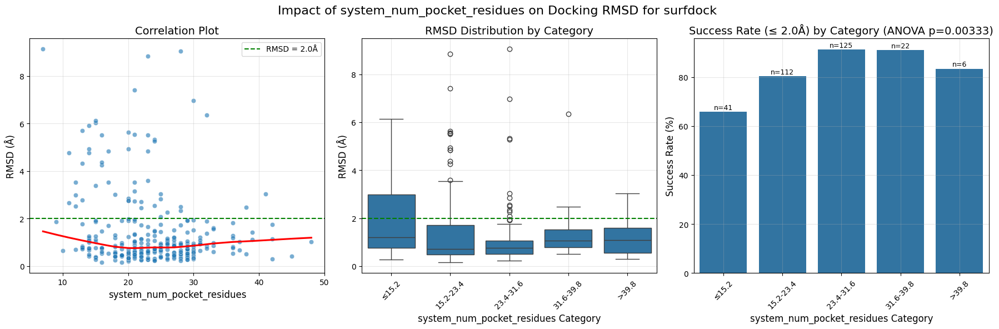


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate  mean_rmsd
0                               ≤15.2           41     65.853659   2.105206
1                           15.2-23.4          112     80.357143   1.447135
2                           23.4-31.6          125     91.200000   1.063433
3                           31.6-39.8           22     90.909091   1.385867
4                               >39.8            6     83.333333   1.279667

ANOVA test: F=4.036, p=0.003333
Significant differences in RMSD across system_num_pocket_residues categories
Welch ANOVA p=0.003333 (used unbalanced‑sizes variant)
Kruskal–Wallis H=18.104, p=0.001178

Impact of system_num_pocket_residues on Docking RMSD for gnina
Pearson correlation: -0.3220, p-value: 0.000000
Spearman correlation: -0.3286, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


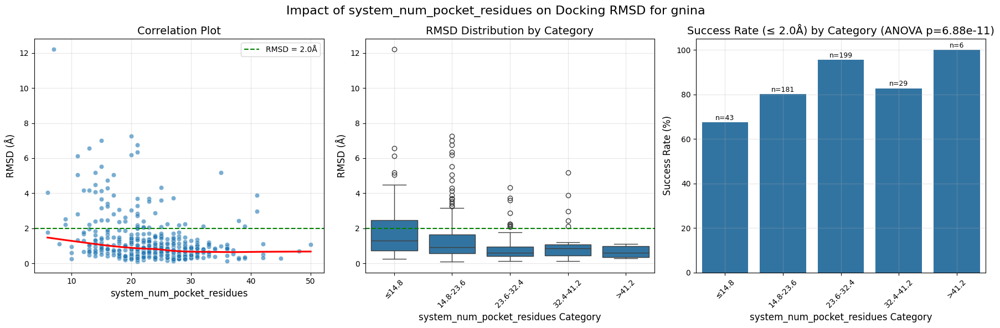


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate  mean_rmsd
0                               ≤14.8           43     67.441860   2.174357
1                           14.8-23.6          181     80.110497   1.396799
2                           23.6-32.4          199     95.477387   0.793921
3                           32.4-41.2           29     82.758621   1.141543
4                               >41.2            6    100.000000   0.658327

ANOVA test: F=14.149, p=0.000000
Significant differences in RMSD across system_num_pocket_residues categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=47.417, p=0.000000

Impact of system_num_pocket_residues on Docking RMSD for chai-1
Pearson correlation: -0.0986, p-value: 0.040125
Spearman correlation: -0.1320, p-value: 0.005902


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


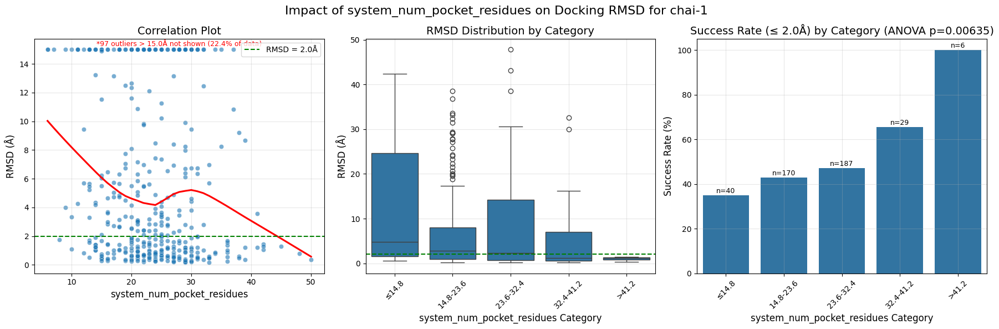


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate  mean_rmsd
0                               ≤14.8           40     35.000000  12.611368
1                           14.8-23.6          170     42.941176   7.048756
2                           23.6-32.4          187     47.058824   8.388923
3                           32.4-41.2           29     65.517241   5.074405
4                               >41.2            6    100.000000   1.040071

ANOVA test: F=3.631, p=0.006349
Significant differences in RMSD across system_num_pocket_residues categories
Welch ANOVA p=0.006349 (used unbalanced‑sizes variant)
Kruskal–Wallis H=15.119, p=0.004460

Impact of system_num_pocket_residues on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.2568, p-value: 0.000000
Spearman correlation: -0.3522, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


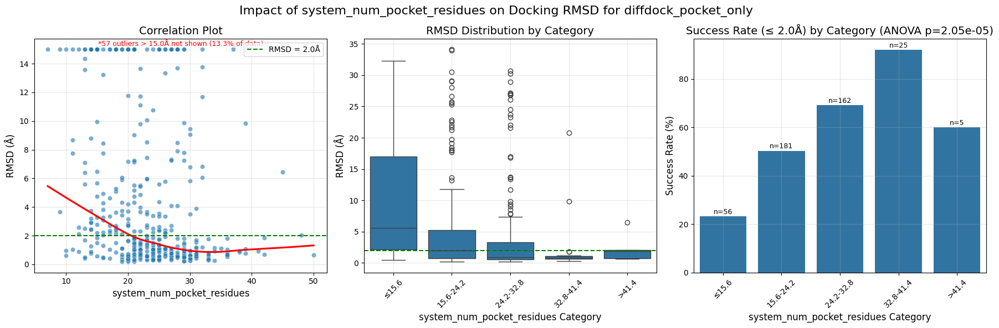


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate  mean_rmsd
0                               ≤15.6           56     23.214286   9.669224
1                           15.6-24.2          181     50.276243   5.262676
2                           24.2-32.8          162     69.135802   4.138977
3                           32.8-41.4           25     92.000000   1.988500
4                               >41.4            5     60.000000   2.344690

ANOVA test: F=6.937, p=0.000020
Significant differences in RMSD across system_num_pocket_residues categories
Welch ANOVA p=0.000020 (used unbalanced‑sizes variant)
Kruskal–Wallis H=45.933, p=0.000000

Impact of system_num_pocket_residues on Docking RMSD for icm
Pearson correlation: -0.2586, p-value: 0.000000
Spearman correlation: -0.2050, p-value: 0.000012


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


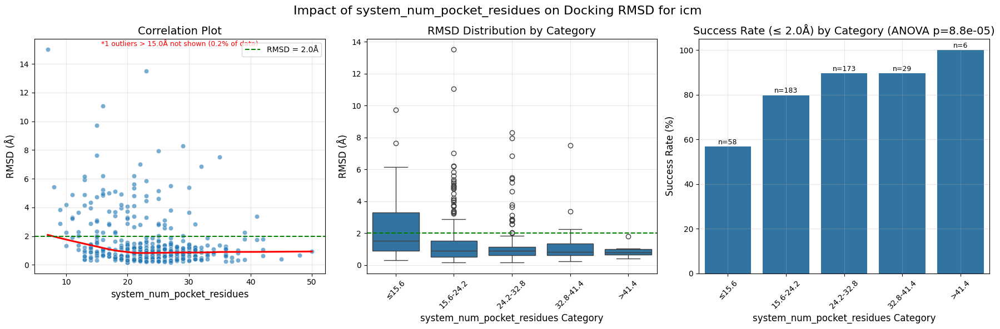


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate  mean_rmsd
0                               ≤15.6           58     56.896552   2.358879
1                           15.6-24.2          183     79.781421   1.566892
2                           24.2-32.8          173     89.595376   1.187984
3                           32.8-41.4           29     89.655172   1.256875
4                               >41.4            6    100.000000   0.912325

ANOVA test: F=6.096, p=0.000088
Significant differences in RMSD across system_num_pocket_residues categories
Welch ANOVA p=0.000088 (used unbalanced‑sizes variant)
Kruskal–Wallis H=24.627, p=0.000060

Impact of system_num_pocket_residues on Docking RMSD for vina
Pearson correlation: 0.0297, p-value: 0.626484
Spearman correlation: 0.0046, p-value: 0.940025


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


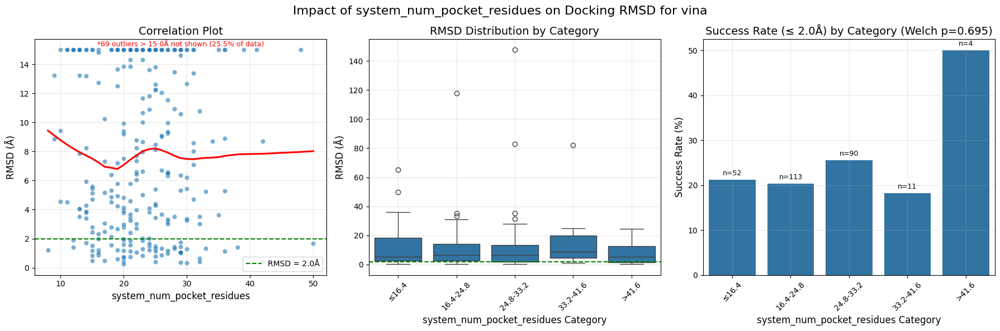


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate  mean_rmsd
0                               ≤16.4           52     21.153846  11.409464
1                           16.4-24.8          113     20.353982  10.438232
2                           24.8-33.2           90     25.555556  11.290735
3                           33.2-41.6           11     18.181818  17.589528
4                               >41.6            4     50.000000   8.825558

ANOVA test: F=0.556, p=0.694911
Welch ANOVA p=0.694911 (used unbalanced‑sizes variant)
Kruskal–Wallis H=1.808, p=0.771109


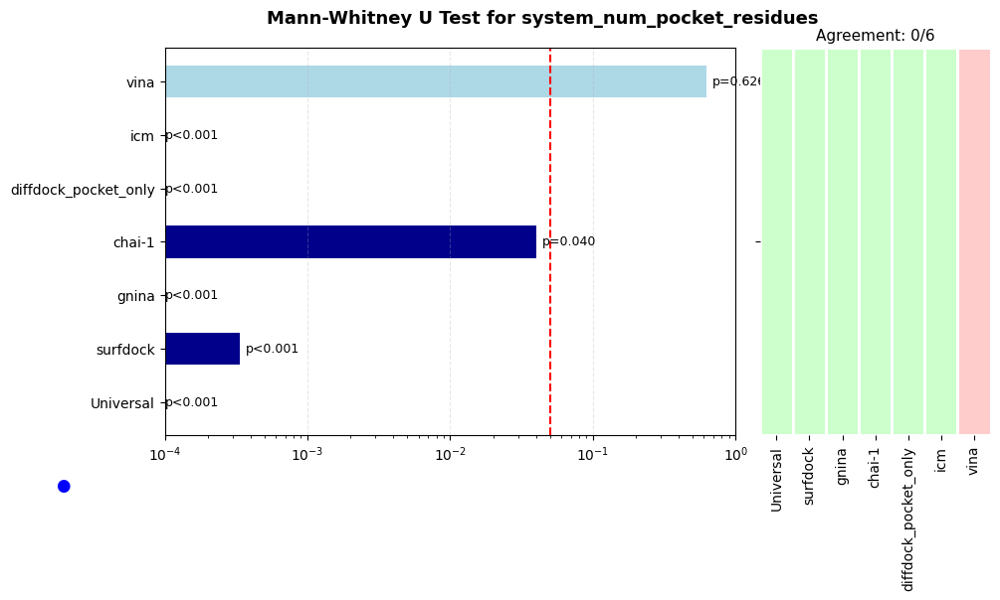

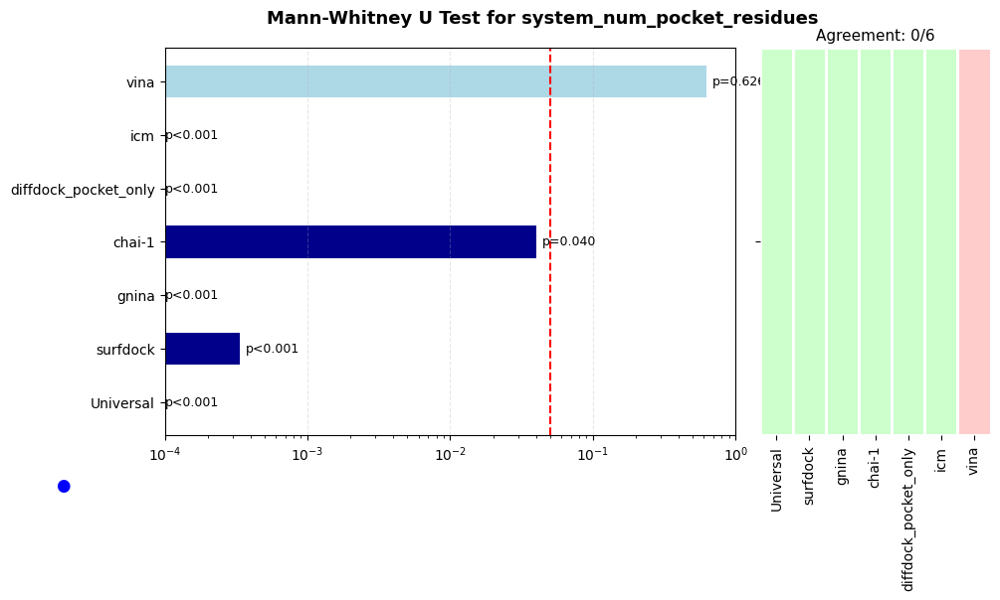

In [15]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="system_num_pocket_residues",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="system_num_pocket_residues",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="system_num_pocket_residues",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### system_num_interactions

Analyzing system_num_interactions for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'system_num_interactions':
Success cases: n=90, mean=12.462, std=4.829
Failure cases: n=102, mean=7.500, std=3.351
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.207

Impact of system_num_interactions on Docking RMSD for surfdock
Pearson correlation: -0.1852, p-value: 0.001114
Spearman correlation: -0.1065, p-value: 0.062451


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


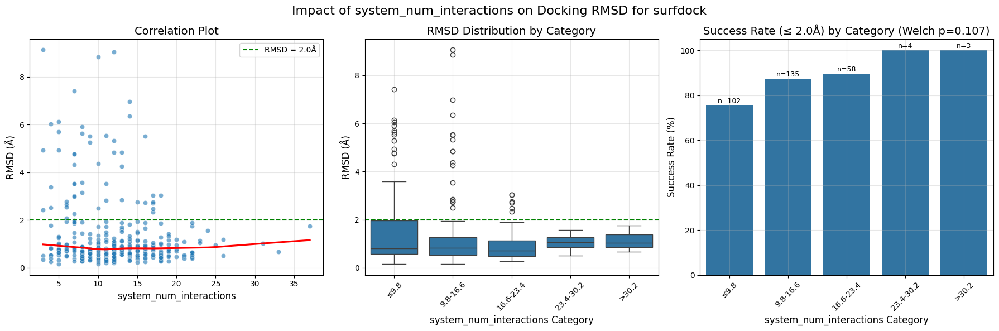


Success rates by category:
  system_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.8          102     75.490196   1.637468
1                         9.8-16.6          135     87.407407   1.330264
2                        16.6-23.4           58     89.655172   0.982386
3                        23.4-30.2            4    100.000000   1.056031
4                            >30.2            3    100.000000   1.152359

ANOVA test: F=1.918, p=0.107347
Welch ANOVA p=0.107347 (used unbalanced‑sizes variant)
Kruskal–Wallis H=4.199, p=0.379716

Impact of system_num_interactions on Docking RMSD for gnina
Pearson correlation: -0.2658, p-value: 0.000000
Spearman correlation: -0.3219, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


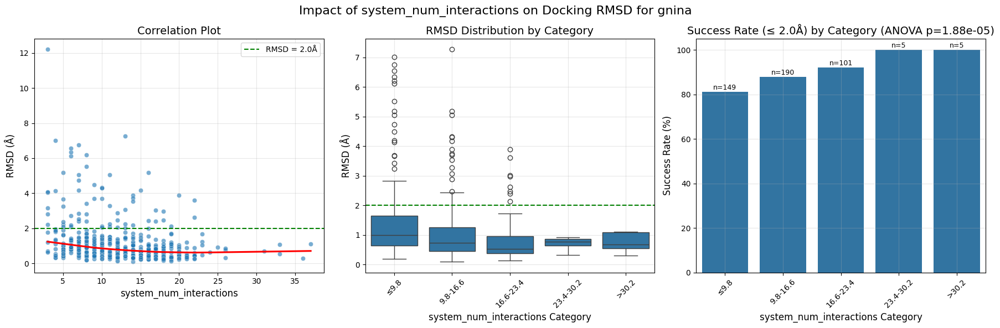


Success rates by category:
  system_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.8          149     81.208054   1.514410
1                         9.8-16.6          190     87.894737   1.055726
2                        16.6-23.4          101     92.079208   0.801632
3                        23.4-30.2            5    100.000000   0.699634
4                            >30.2            5    100.000000   0.740113

ANOVA test: F=6.975, p=0.000019
Significant differences in RMSD across system_num_interactions categories
Welch ANOVA p=0.000019 (used unbalanced‑sizes variant)
Kruskal–Wallis H=38.047, p=0.000000

Impact of system_num_interactions on Docking RMSD for chai-1
Pearson correlation: -0.0285, p-value: 0.553564
Spearman correlation: -0.1202, p-value: 0.012217


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


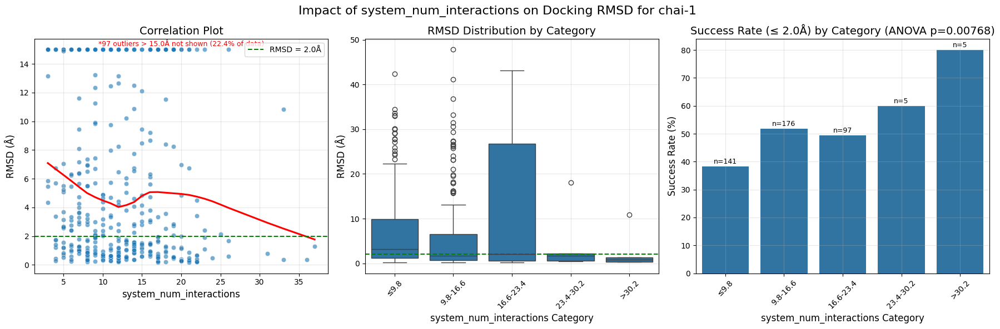


Success rates by category:
  system_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.8          141     38.297872   7.925539
1                         9.8-16.6          176     51.704545   6.163357
2                        16.6-23.4           97     49.484536  10.731492
3                        23.4-30.2            5     60.000000   4.579829
4                            >30.2            5     80.000000   2.736223

ANOVA test: F=3.520, p=0.007680
Significant differences in RMSD across system_num_interactions categories
Welch ANOVA p=0.007680 (used unbalanced‑sizes variant)
Kruskal–Wallis H=8.672, p=0.069844

Impact of system_num_interactions on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.2295, p-value: 0.000002
Spearman correlation: -0.3116, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


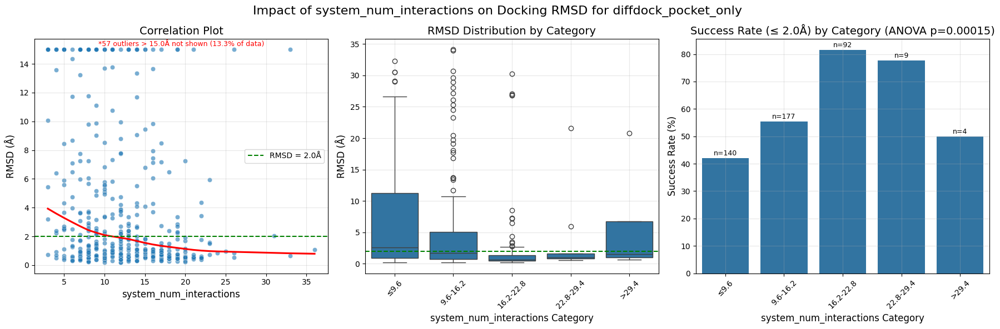


Success rates by category:
  system_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.6          140     42.142857   7.217508
1                         9.6-16.2          177     55.367232   4.838312
2                        16.2-22.8           92     81.521739   2.390164
3                        22.8-29.4            9     77.777778   3.836750
4                            >29.4            4     50.000000   6.137022

ANOVA test: F=5.799, p=0.000150
Significant differences in RMSD across system_num_interactions categories
Welch ANOVA p=0.000150 (used unbalanced‑sizes variant)
Kruskal–Wallis H=44.069, p=0.000000

Impact of system_num_interactions on Docking RMSD for icm
Pearson correlation: -0.1480, p-value: 0.001646
Spearman correlation: -0.0945, p-value: 0.045230


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


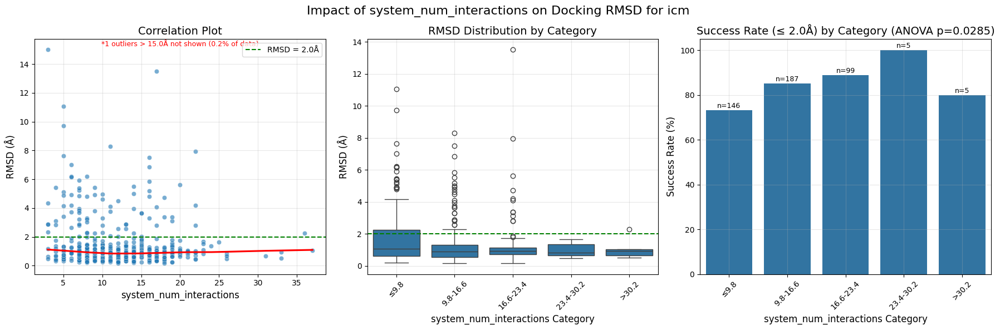


Success rates by category:
  system_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.8          146     73.287671   1.849159
1                         9.8-16.6          187     85.026738   1.299946
2                        16.6-23.4           99     88.888889   1.341920
3                        23.4-30.2            5    100.000000   0.995056
4                            >30.2            5     80.000000   1.085094

ANOVA test: F=2.737, p=0.028464
Significant differences in RMSD across system_num_interactions categories
Welch ANOVA p=0.028464 (used unbalanced‑sizes variant)
Kruskal–Wallis H=6.934, p=0.139414

Impact of system_num_interactions on Docking RMSD for vina
Pearson correlation: 0.0801, p-value: 0.188556
Spearman correlation: 0.0505, p-value: 0.407216


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


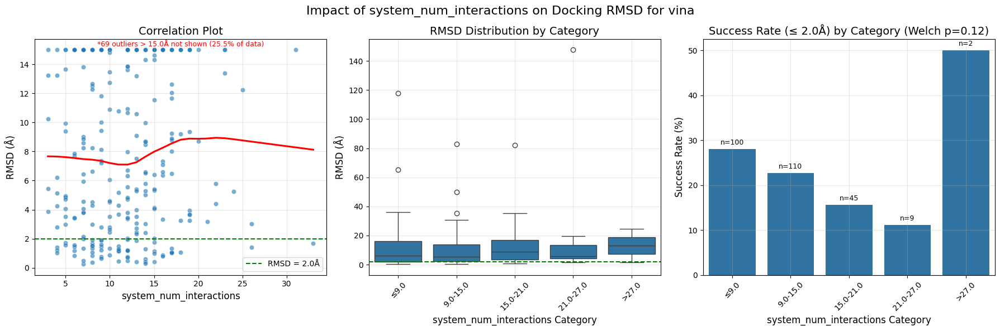


Success rates by category:
  system_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.0          100     28.000000  10.810683
1                         9.0-15.0          110     22.727273   9.673762
2                        15.0-21.0           45     15.555556  12.762064
3                        21.0-27.0            9     11.111111  23.652730
4                            >27.0            2     50.000000  13.099599

ANOVA test: F=1.850, p=0.119669
Welch ANOVA p=0.119669 (used unbalanced‑sizes variant)
Kruskal–Wallis H=3.289, p=0.510734


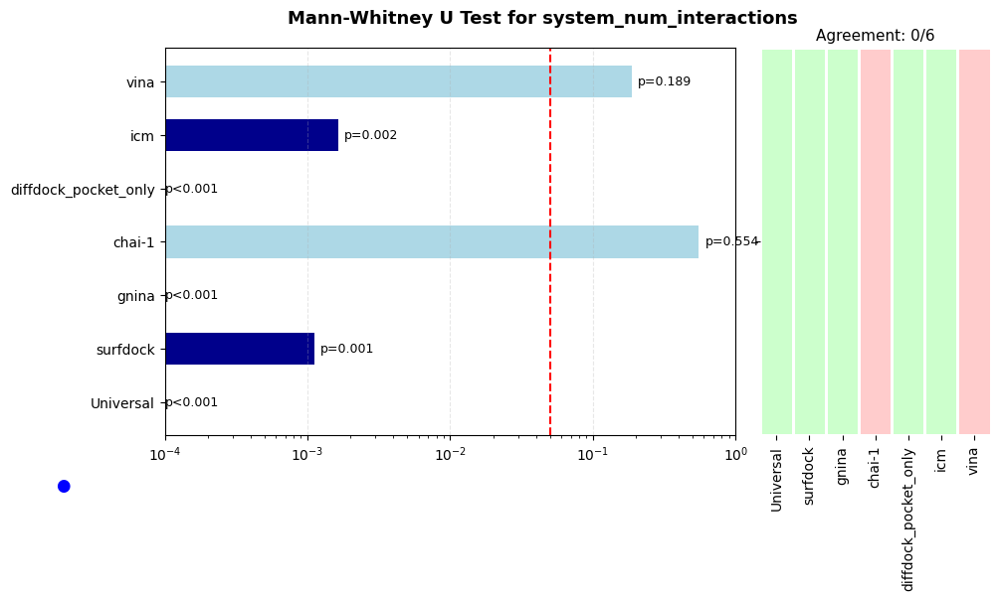

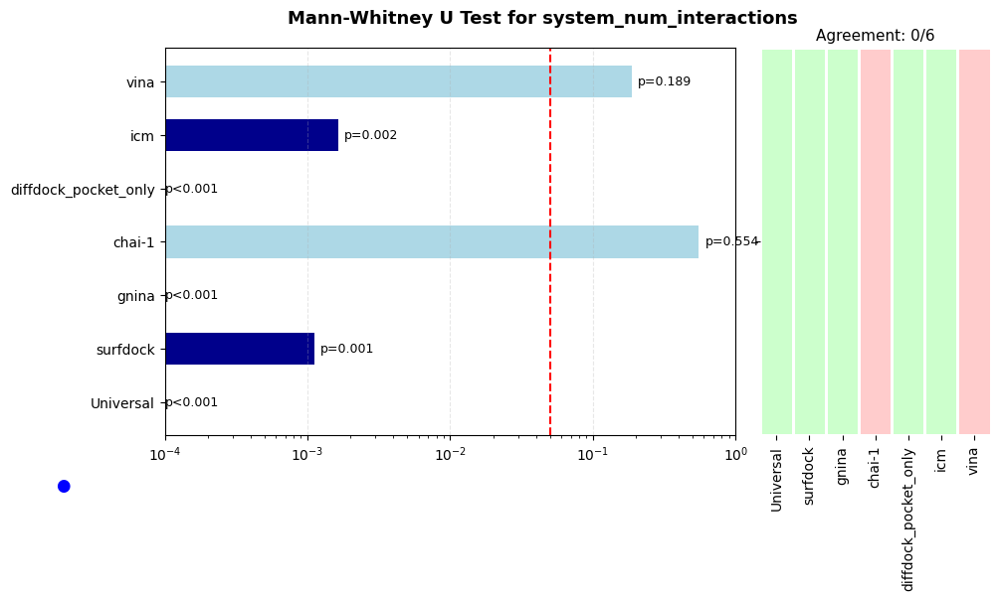

In [16]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="system_num_interactions",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="system_num_interactions",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="system_num_interactions",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_molecular_weight

Analyzing ligand_molecular_weight for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_molecular_weight':
Success cases: n=90, mean=392.126, std=119.079
Failure cases: n=102, mean=478.055, std=127.455
Mann-Whitney U test: p=0.000077
Effect size (Cohen's d): 0.695
Chi-square test for distribution: p=0.000000

Impact of ligand_molecular_weight on Docking RMSD for surfdock
Pearson correlation: 0.1559, p-value: 0.006204
Spearman correlation: 0.3916, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


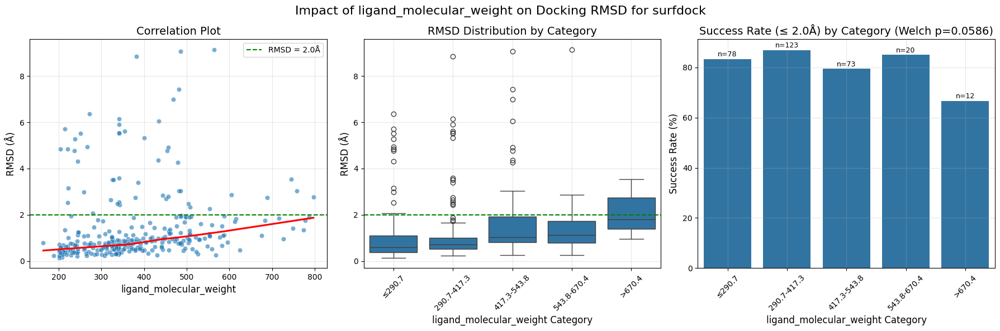


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate  mean_rmsd
0                           ≤290.7           78     83.333333   1.224682
1                      290.7-417.3          123     86.991870   1.199667
2                      417.3-543.8           73     79.452055   1.748750
3                      543.8-670.4           20     85.000000   1.645606
4                           >670.4           12     66.666667   2.015988

ANOVA test: F=2.302, p=0.058634
Welch ANOVA p=0.058634 (used unbalanced‑sizes variant)
Kruskal–Wallis H=45.444, p=0.000000

Impact of ligand_molecular_weight on Docking RMSD for gnina
Pearson correlation: 0.2683, p-value: 0.000000
Spearman correlation: 0.2522, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


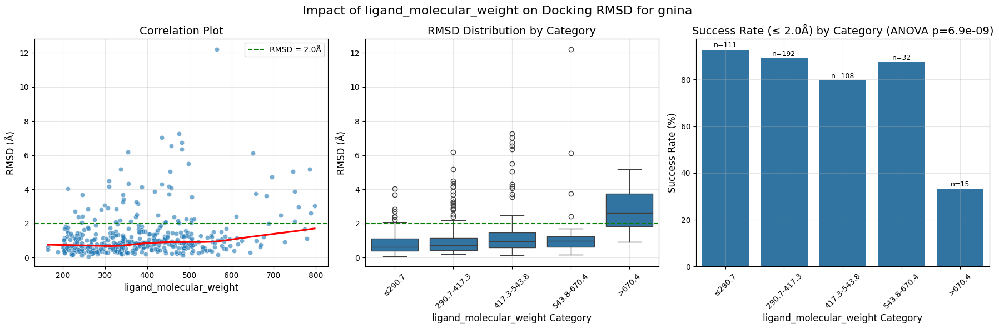


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate  mean_rmsd
0                           ≤290.7          111     92.792793   0.878065
1                      290.7-417.3          192     89.062500   1.029567
2                      417.3-543.8          108     79.629630   1.478019
3                      543.8-670.4           32     87.500000   1.523312
4                           >670.4           15     33.333333   2.837939

ANOVA test: F=11.484, p=0.000000
Significant differences in RMSD across ligand_molecular_weight categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=42.481, p=0.000000

Impact of ligand_molecular_weight on Docking RMSD for chai-1
Pearson correlation: -0.0637, p-value: 0.185615
Spearman correlation: 0.0416, p-value: 0.387750


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


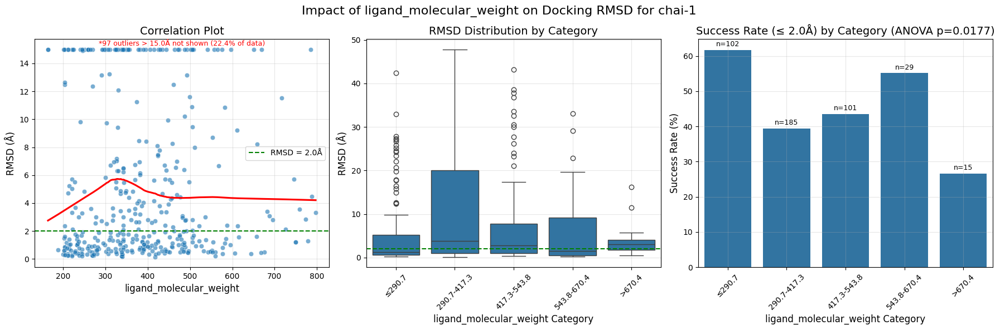


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate  mean_rmsd
0                           ≤290.7          102     61.764706   5.983827
1                      290.7-417.3          185     39.459459   9.776109
2                      417.3-543.8          101     43.564356   7.210102
3                      543.8-670.4           29     55.172414   6.965190
4                           >670.4           15     26.666667   4.227860

ANOVA test: F=3.024, p=0.017680
Significant differences in RMSD across ligand_molecular_weight categories
Welch ANOVA p=0.017680 (used unbalanced‑sizes variant)
Kruskal–Wallis H=15.943, p=0.003096

Impact of ligand_molecular_weight on Docking RMSD for diffdock_pocket_only
Pearson correlation: 0.0045, p-value: 0.925338
Spearman correlation: 0.0826, p-value: 0.087256


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


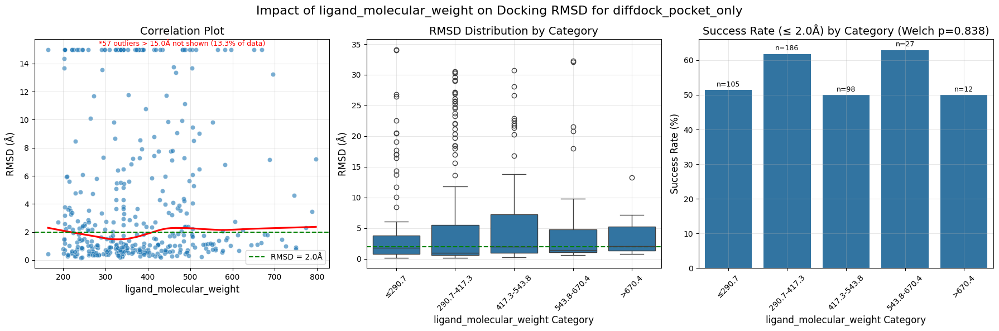


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate  mean_rmsd
0                           ≤290.7          105     51.428571   4.674210
1                      290.7-417.3          186     61.827957   5.425046
2                      417.3-543.8           98     50.000000   5.393296
3                      543.8-670.4           27     62.962963   6.168351
4                           >670.4           12     50.000000   3.809992

ANOVA test: F=0.359, p=0.837651
Welch ANOVA p=0.837651 (used unbalanced‑sizes variant)
Kruskal–Wallis H=8.906, p=0.063502

Impact of ligand_molecular_weight on Docking RMSD for icm
Pearson correlation: 0.2242, p-value: 0.000002
Spearman correlation: 0.2200, p-value: 0.000002


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


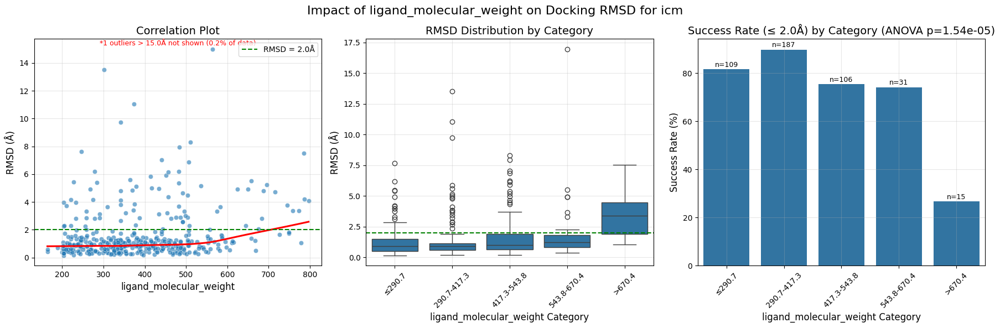


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate  mean_rmsd
0                           ≤290.7          109     81.651376   1.358059
1                      290.7-417.3          187     89.839572   1.271714
2                      417.3-543.8          106     75.471698   1.718424
3                      543.8-670.4           31     74.193548   2.155615
4                           >670.4           15     26.666667   3.476868

ANOVA test: F=7.089, p=0.000015
Significant differences in RMSD across ligand_molecular_weight categories
Welch ANOVA p=0.000015 (used unbalanced‑sizes variant)
Kruskal–Wallis H=34.563, p=0.000001

Impact of ligand_molecular_weight on Docking RMSD for vina
Pearson correlation: 0.1149, p-value: 0.058979
Spearman correlation: 0.0776, p-value: 0.203045


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


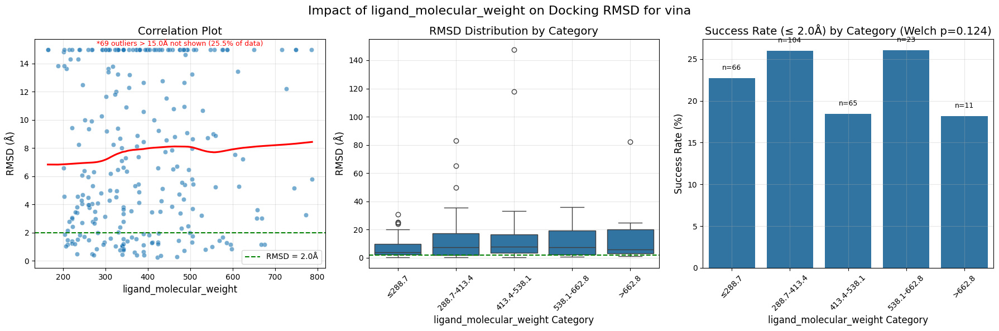


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate  mean_rmsd
0                           ≤288.7           66     22.727273   7.019540
1                      288.7-413.4          104     25.961538  11.663444
2                      413.4-538.1           65     18.461538  13.306848
3                      538.1-662.8           23     26.086957  11.314848
4                           >662.8           11     18.181818  16.307611

ANOVA test: F=1.827, p=0.123924
Welch ANOVA p=0.123924 (used unbalanced‑sizes variant)
Kruskal–Wallis H=5.961, p=0.202083


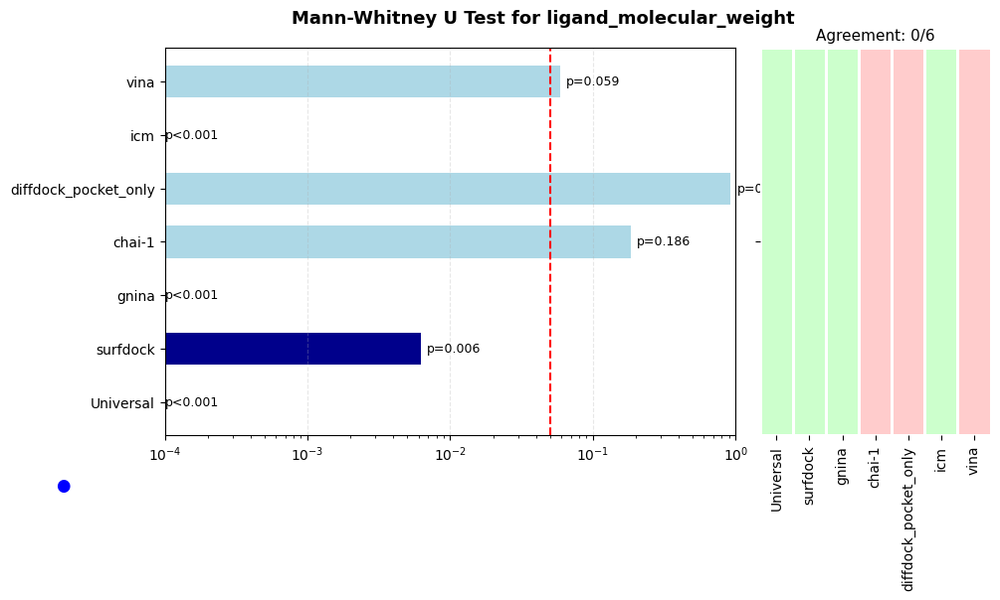

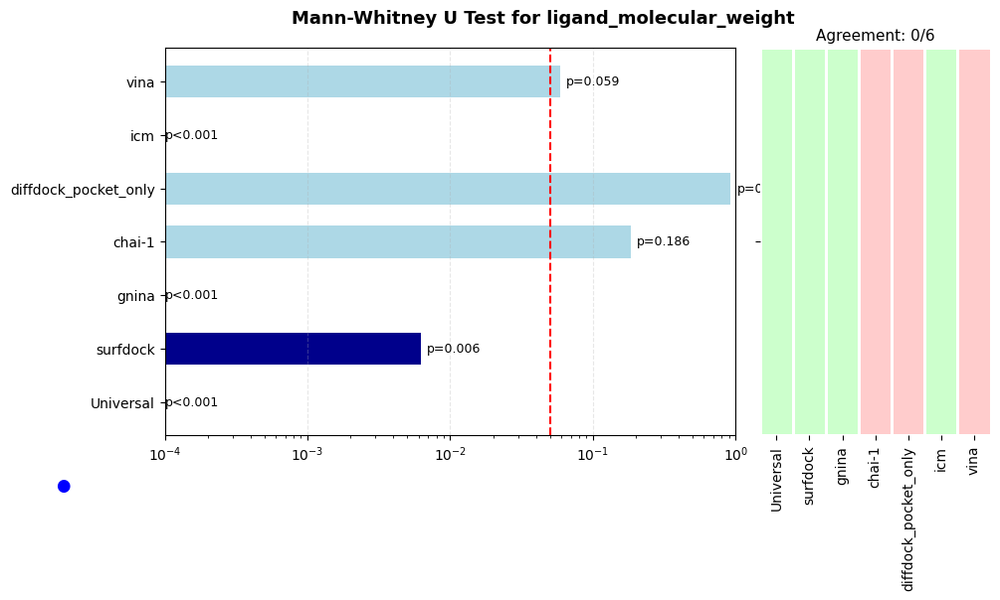

In [17]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_molecular_weight",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_molecular_weight",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_molecular_weight",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_crippen_clogp

Analyzing ligand_crippen_clogp for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_crippen_clogp':
Success cases: n=90, mean=2.217, std=3.130
Failure cases: n=102, mean=-2.986, std=1.943
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.026
Chi-square test for distribution: p=0.000000

Impact of ligand_crippen_clogp on Docking RMSD for surfdock
Pearson correlation: -0.0124, p-value: 0.828223
Spearman correlation: -0.0666, p-value: 0.244625


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


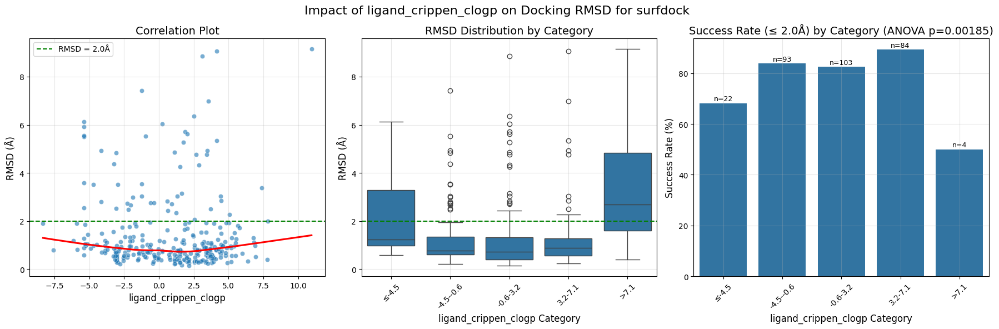


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate  mean_rmsd
0                         ≤-4.5           22     68.181818   2.246999
1                     -4.5--0.6           93     83.870968   1.293388
2                      -0.6-3.2          103     82.524272   1.316852
3                       3.2-7.1           84     89.285714   1.267301
4                          >7.1            4     50.000000   3.731252

ANOVA test: F=4.385, p=0.001845
Significant differences in RMSD across ligand_crippen_clogp categories
Welch ANOVA p=0.001845 (used unbalanced‑sizes variant)
Kruskal–Wallis H=19.539, p=0.000616

Impact of ligand_crippen_clogp on Docking RMSD for gnina
Pearson correlation: 0.0105, p-value: 0.822557
Spearman correlation: 0.0127, p-value: 0.786580


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


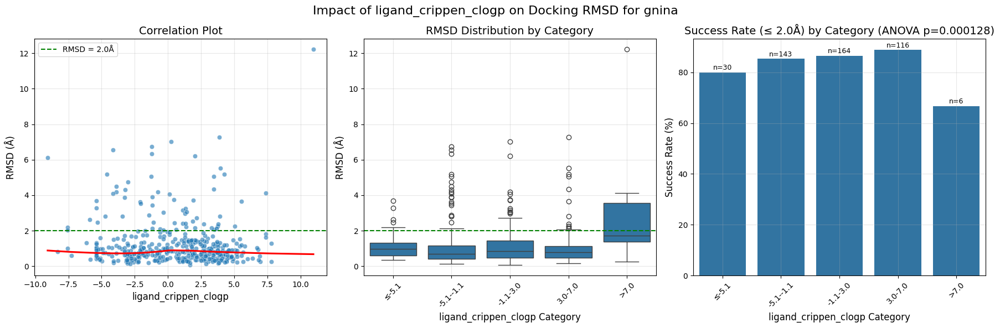


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate  mean_rmsd
0                         ≤-5.1           30     80.000000   1.198847
1                     -5.1--1.1          143     85.314685   1.192216
2                      -1.1-3.0          164     86.585366   1.159687
3                       3.0-7.0          116     88.793103   1.061018
4                          >7.0            6     66.666667   3.560431

ANOVA test: F=5.878, p=0.000128
Significant differences in RMSD across ligand_crippen_clogp categories
Welch ANOVA p=0.000128 (used unbalanced‑sizes variant)
Kruskal–Wallis H=9.497, p=0.049800

Impact of ligand_crippen_clogp on Docking RMSD for chai-1
Pearson correlation: -0.1685, p-value: 0.000422
Spearman correlation: -0.0305, p-value: 0.526571


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


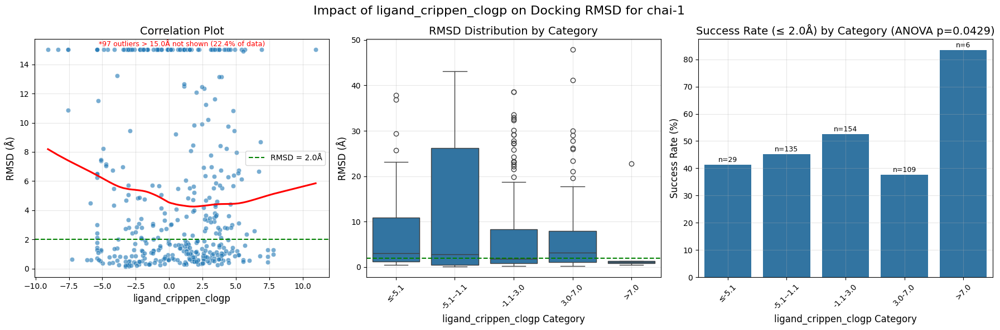


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate  mean_rmsd
0                         ≤-5.1           29     41.379310   8.805350
1                     -5.1--1.1          135     45.185185  10.135442
2                      -1.1-3.0          154     52.597403   6.815176
3                       3.0-7.0          109     37.614679   6.779067
4                          >7.0            6     83.333333   4.603069

ANOVA test: F=2.487, p=0.042916
Significant differences in RMSD across ligand_crippen_clogp categories
Welch ANOVA p=0.042916 (used unbalanced‑sizes variant)
Kruskal–Wallis H=3.421, p=0.490061

Impact of ligand_crippen_clogp on Docking RMSD for diffdock_pocket_only
Pearson correlation: 0.0914, p-value: 0.058328
Spearman correlation: 0.1101, p-value: 0.022422


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


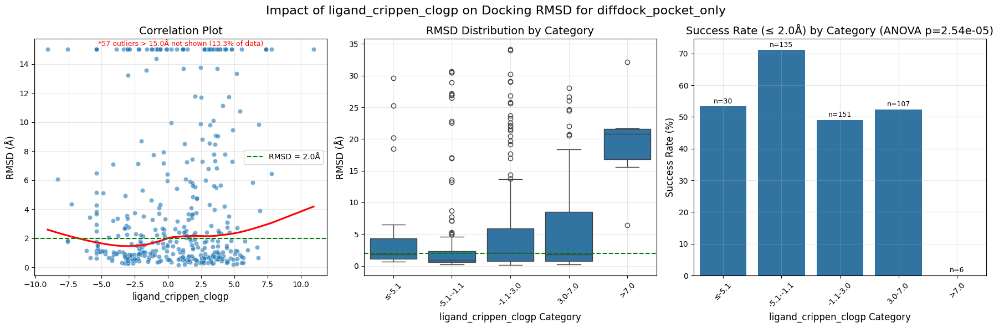


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate  mean_rmsd
0                         ≤-5.1           30     53.333333   5.194318
1                     -5.1--1.1          135     71.111111   3.734899
2                      -1.1-3.0          151     49.006623   5.592027
3                       3.0-7.0          107     52.336449   5.644626
4                          >7.0            6      0.000000  19.567788

ANOVA test: F=6.812, p=0.000025
Significant differences in RMSD across ligand_crippen_clogp categories
Welch ANOVA p=0.000025 (used unbalanced‑sizes variant)
Kruskal–Wallis H=31.881, p=0.000002

Impact of ligand_crippen_clogp on Docking RMSD for icm
Pearson correlation: -0.0741, p-value: 0.116556
Spearman correlation: -0.1339, p-value: 0.004433


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


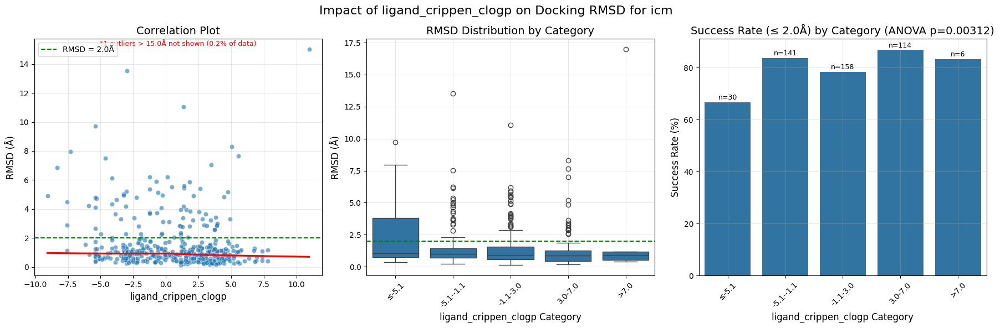


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate  mean_rmsd
0                         ≤-5.1           30     66.666667   2.331378
1                     -5.1--1.1          141     83.687943   1.501703
2                      -1.1-3.0          158     78.481013   1.512480
3                       3.0-7.0          114     86.842105   1.242107
4                          >7.0            6     83.333333   3.467666

ANOVA test: F=4.045, p=0.003117
Significant differences in RMSD across ligand_crippen_clogp categories
Welch ANOVA p=0.003117 (used unbalanced‑sizes variant)
Kruskal–Wallis H=8.772, p=0.067058

Impact of ligand_crippen_clogp on Docking RMSD for vina
Pearson correlation: -0.0833, p-value: 0.171632
Spearman correlation: -0.0786, p-value: 0.197325


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


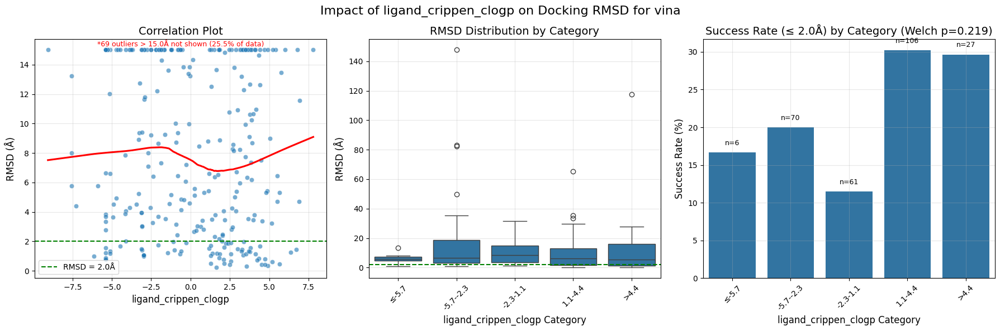


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate  mean_rmsd
0                         ≤-5.7            6     16.666667   6.362812
1                     -5.7--2.3           70     20.000000  14.417084
2                      -2.3-1.1           61     11.475410  10.221880
3                       1.1-4.4          106     30.188679   9.211906
4                          >4.4           27     29.629630  12.423214

ANOVA test: F=1.447, p=0.218774
Welch ANOVA p=0.218774 (used unbalanced‑sizes variant)
Kruskal–Wallis H=4.664, p=0.323570


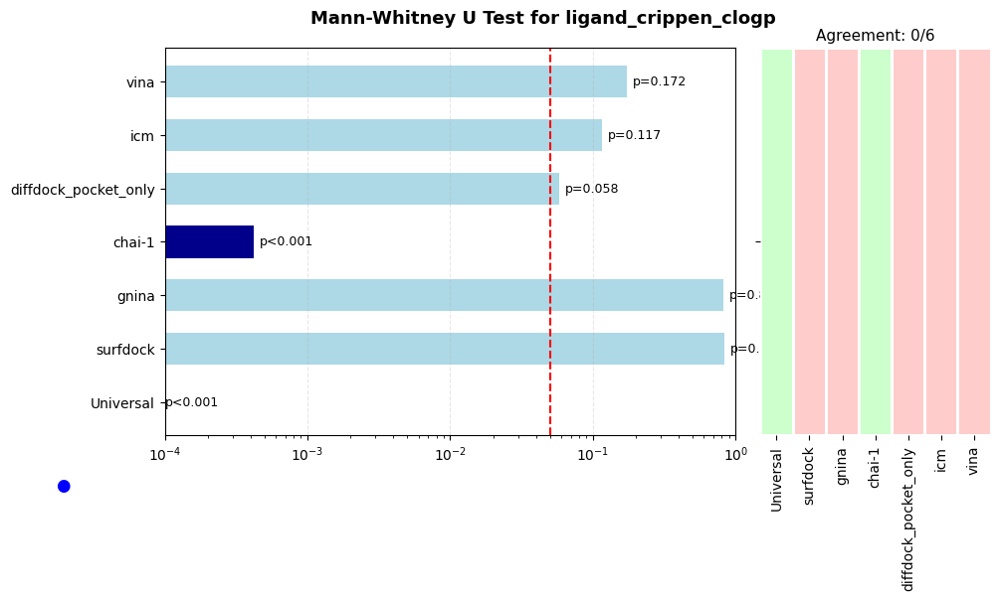

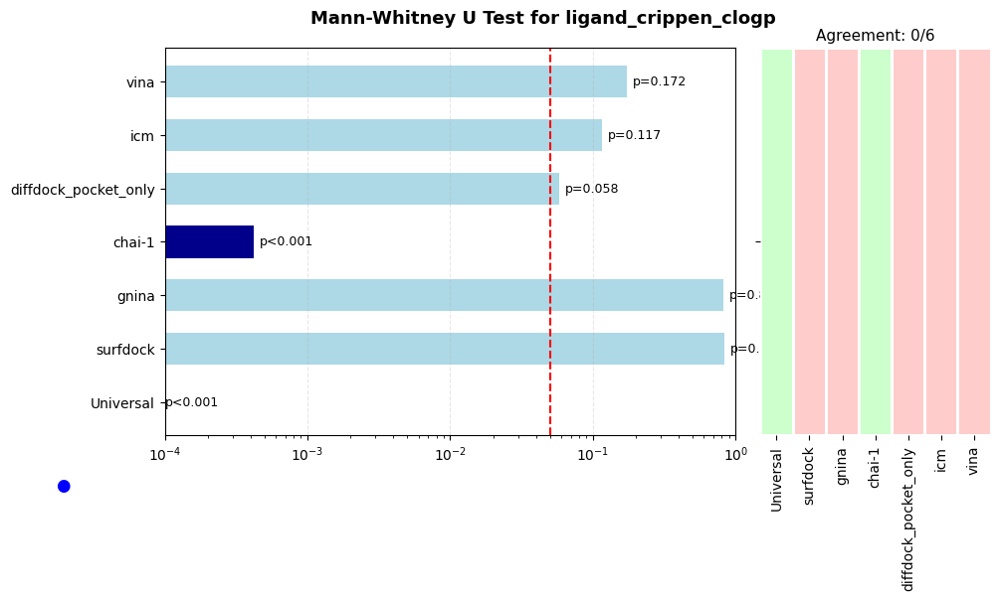

In [18]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_crippen_clogp",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_crippen_clogp",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_crippen_clogp",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_interacting_residues

Analyzing ligand_num_interacting_residues for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_interacting_residues':
Success cases: n=90, mean=9.231, std=2.711
Failure cases: n=102, mean=5.500, std=2.667
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.388
Chi-square test for distribution: p=0.000000

Impact of ligand_num_interacting_residues on Docking RMSD for surfdock
Pearson correlation: -0.2123, p-value: 0.000178
Spearman correlation: -0.1366, p-value: 0.016660


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


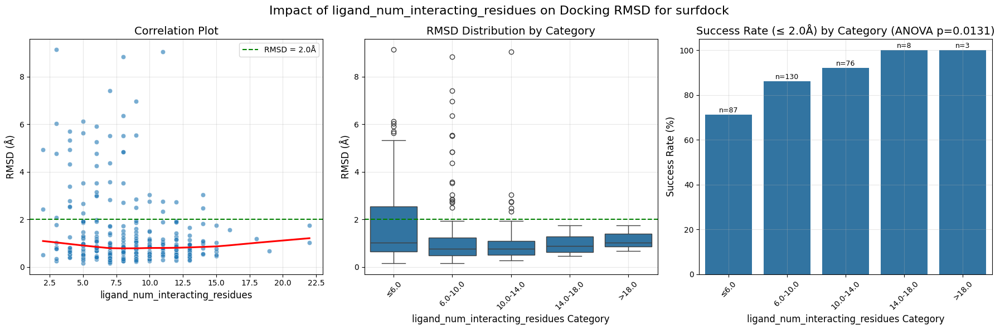


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤6.0           87     71.264368   
1                                 6.0-10.0          130     86.153846   
2                                10.0-14.0           76     92.105263   
3                                14.0-18.0            8    100.000000   
4                                    >18.0            3    100.000000   

   mean_rmsd  
0   1.850324  
1   1.299803  
2   1.044855  
3   0.991125  
4   1.152359  

ANOVA test: F=3.219, p=0.013133
Significant differences in RMSD across ligand_num_interacting_residues categories
Welch ANOVA p=0.013133 (used unbalanced‑sizes variant)
Kruskal–Wallis H=11.243, p=0.023967

Impact of ligand_num_interacting_residues on Docking RMSD for gnina
Pearson correlation: -0.2763, p-value: 0.000000
Spearman correlation: -0.3314, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


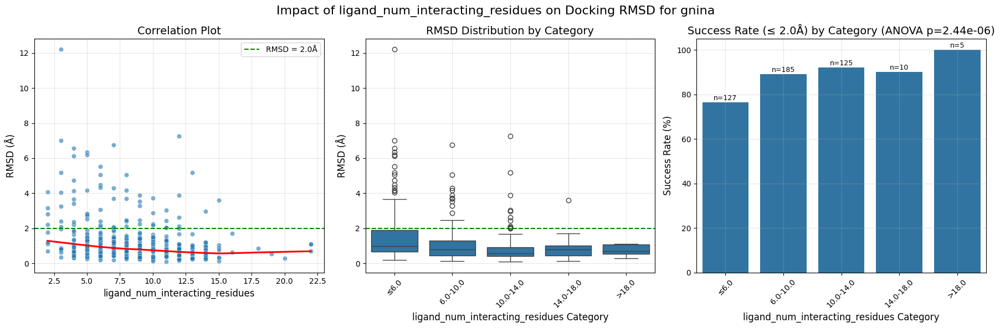


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤6.0          127     76.377953   
1                                 6.0-10.0          185     89.189189   
2                                10.0-14.0          125     92.000000   
3                                14.0-18.0           10     90.000000   
4                                    >18.0            5    100.000000   

   mean_rmsd  
0   1.685323  
1   1.056747  
2   0.852930  
3   1.030773  
4   0.740113  

ANOVA test: F=8.135, p=0.000002
Significant differences in RMSD across ligand_num_interacting_residues categories
Welch ANOVA p=0.000002 (used unbalanced‑sizes variant)
Kruskal–Wallis H=37.279, p=0.000000

Impact of ligand_num_interacting_residues on Docking RMSD for chai-1
Pearson correlation: -0.0188, p-value: 0.696287
Spearman correlation: -0.1269, p-value: 0.008113


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


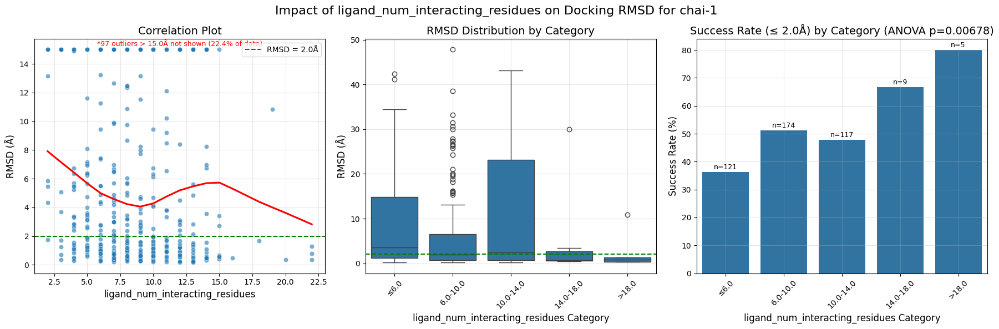


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤6.0          121     36.363636   
1                                 6.0-10.0          174     51.149425   
2                                10.0-14.0          117     47.863248   
3                                14.0-18.0            9     66.666667   
4                                    >18.0            5     80.000000   

   mean_rmsd  
0   8.999179  
1   5.965474  
2   9.958625  
3   4.502831  
4   2.736223  

ANOVA test: F=3.594, p=0.006776
Significant differences in RMSD across ligand_num_interacting_residues categories
Welch ANOVA p=0.006776 (used unbalanced‑sizes variant)
Kruskal–Wallis H=14.461, p=0.005960

Impact of ligand_num_interacting_residues on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.2570, p-value: 0.000000
Spearman correlation: -0.3530, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


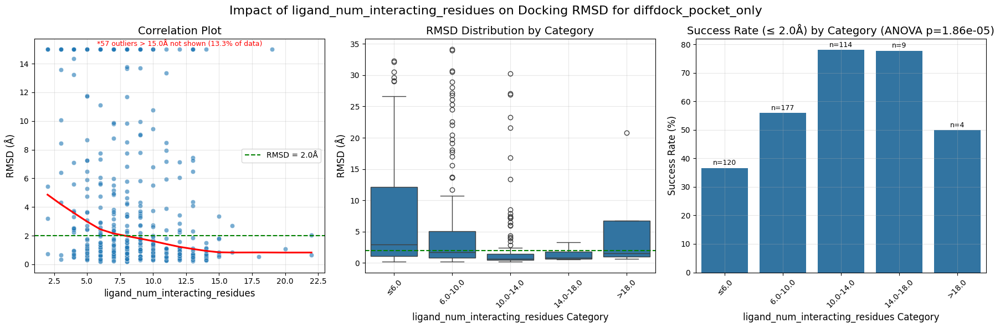


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤6.0          120     36.666667   
1                                 6.0-10.0          177     55.932203   
2                                10.0-14.0          114     78.070175   
3                                14.0-18.0            9     77.777778   
4                                    >18.0            4     50.000000   

   mean_rmsd  
0   7.789648  
1   5.109799  
2   2.730079  
3   1.449039  
4   6.137022  

ANOVA test: F=6.992, p=0.000019
Significant differences in RMSD across ligand_num_interacting_residues categories
Welch ANOVA p=0.000019 (used unbalanced‑sizes variant)
Kruskal–Wallis H=50.063, p=0.000000

Impact of ligand_num_interacting_residues on Docking RMSD for icm
Pearson correlation: -0.1543, p-value: 0.001025
Spearman correlation: -0.1066, p-value: 0.023724


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


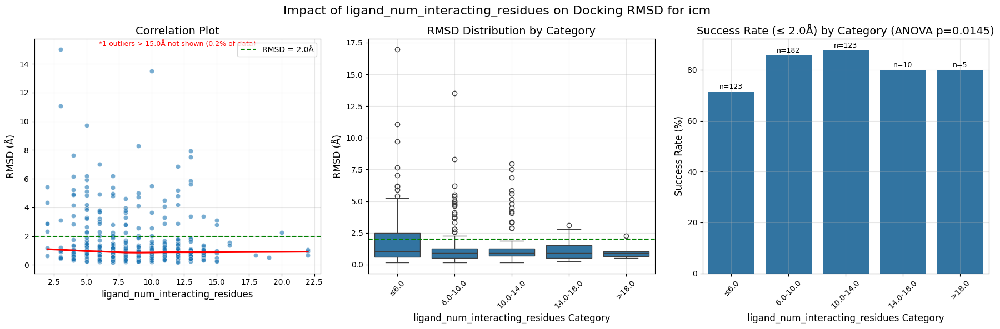


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤6.0          123     71.544715   
1                                 6.0-10.0          182     85.714286   
2                                10.0-14.0          123     87.804878   
3                                14.0-18.0           10     80.000000   
4                                    >18.0            5     80.000000   

   mean_rmsd  
0   1.990347  
1   1.301008  
2   1.373701  
3   1.231473  
4   1.085094  

ANOVA test: F=3.144, p=0.014454
Significant differences in RMSD across ligand_num_interacting_residues categories
Welch ANOVA p=0.014454 (used unbalanced‑sizes variant)
Kruskal–Wallis H=7.561, p=0.109053

Impact of ligand_num_interacting_residues on Docking RMSD for vina
Pearson correlation: 0.0599, p-value: 0.326075
Spearman correlation: 0.0382, p-value: 0.530725


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


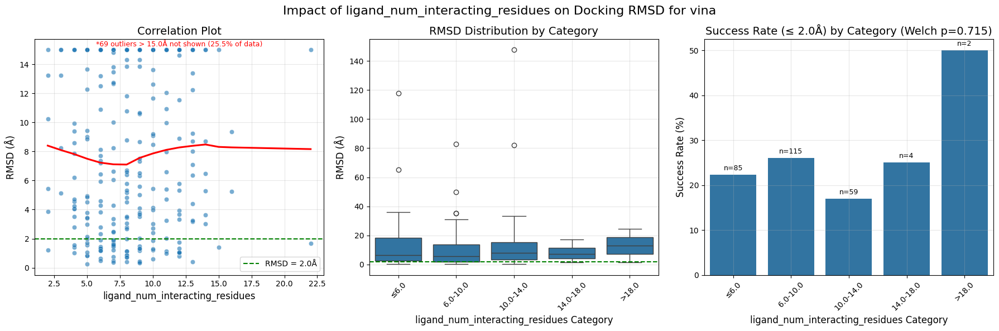


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤6.0           85     22.352941   
1                                 6.0-10.0          115     26.086957   
2                                10.0-14.0           59     16.949153   
3                                14.0-18.0            4     25.000000   
4                                    >18.0            2     50.000000   

   mean_rmsd  
0  11.561409  
1   9.839056  
2  13.283473  
3   8.303357  
4  13.099599  

ANOVA test: F=0.528, p=0.714909
Welch ANOVA p=0.714909 (used unbalanced‑sizes variant)
Kruskal–Wallis H=1.565, p=0.815071


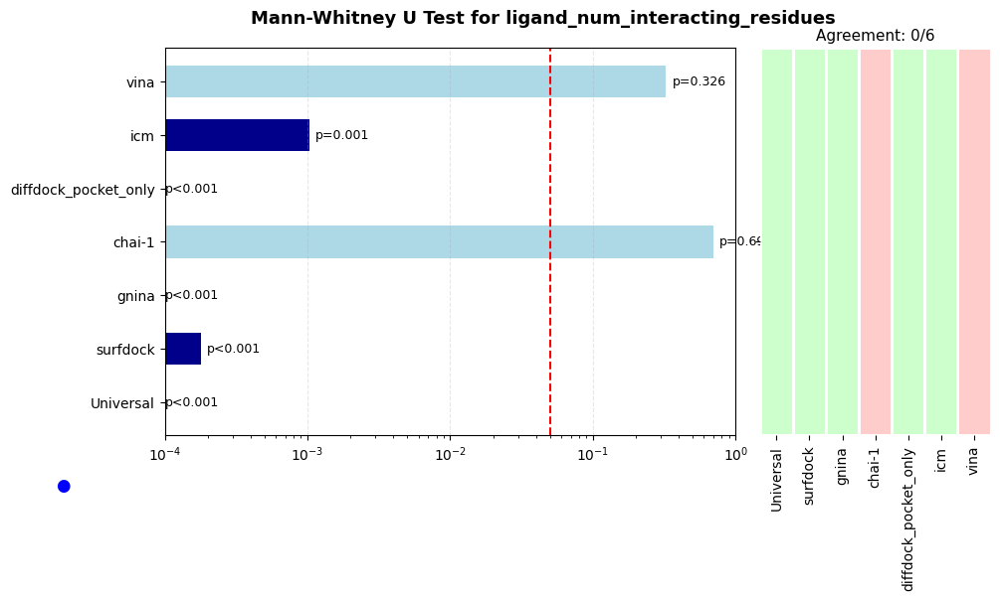

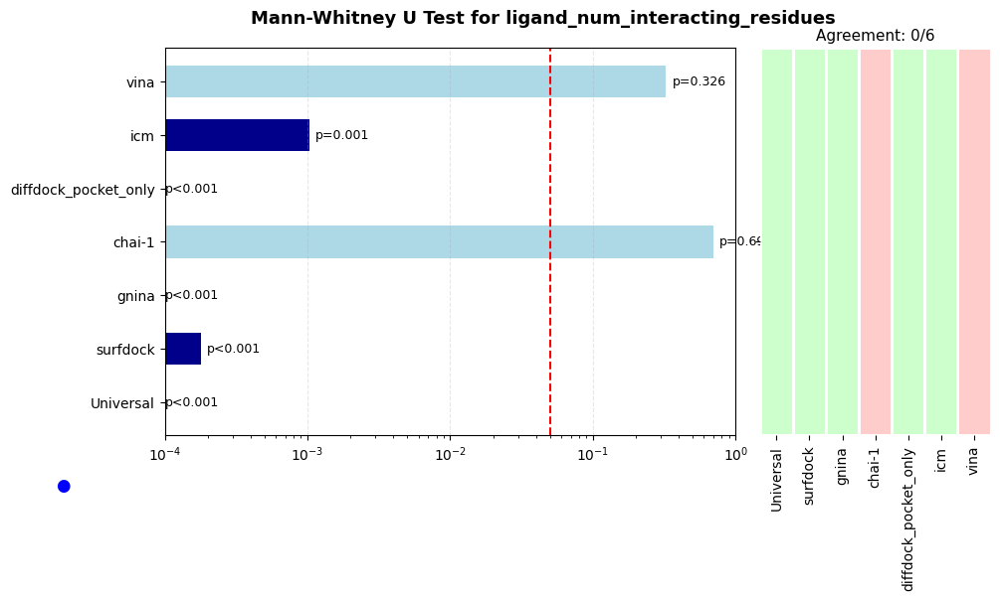

In [21]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_interacting_residues",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_interacting_residues",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_interacting_residues",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_interactions

Analyzing ligand_num_interactions for 15 cases where all methods succeed
and 17 cases where all methods fail

Universal analysis of continuous property 'ligand_num_interactions':
Success cases: n=90, mean=12.462, std=4.829
Failure cases: n=102, mean=7.500, std=3.351
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.207

Impact of ligand_num_interactions on Docking RMSD for surfdock
Pearson correlation: -0.1852, p-value: 0.001114
Spearman correlation: -0.1065, p-value: 0.062451


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


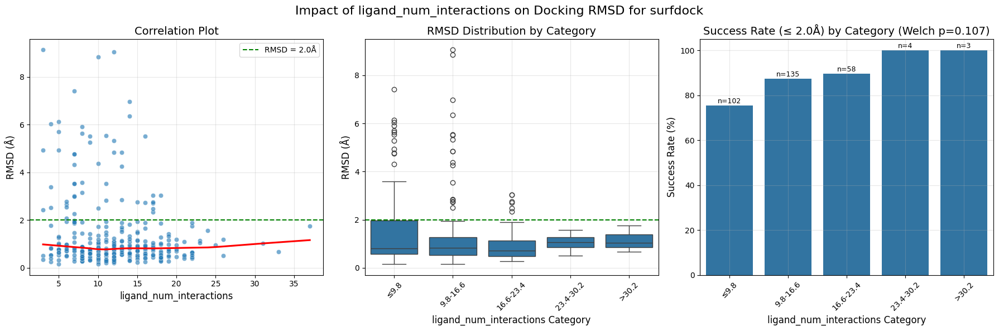


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.8          102     75.490196   1.637468
1                         9.8-16.6          135     87.407407   1.330264
2                        16.6-23.4           58     89.655172   0.982386
3                        23.4-30.2            4    100.000000   1.056031
4                            >30.2            3    100.000000   1.152359

ANOVA test: F=1.918, p=0.107347
Welch ANOVA p=0.107347 (used unbalanced‑sizes variant)
Kruskal–Wallis H=4.199, p=0.379716

Impact of ligand_num_interactions on Docking RMSD for gnina
Pearson correlation: -0.2658, p-value: 0.000000
Spearman correlation: -0.3219, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


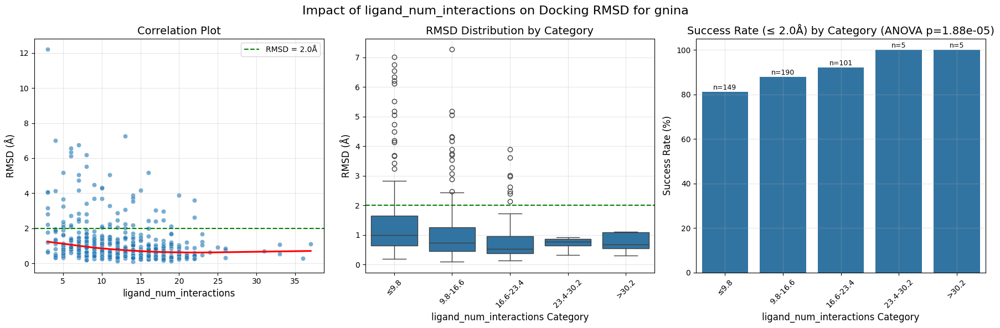


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.8          149     81.208054   1.514410
1                         9.8-16.6          190     87.894737   1.055726
2                        16.6-23.4          101     92.079208   0.801632
3                        23.4-30.2            5    100.000000   0.699634
4                            >30.2            5    100.000000   0.740113

ANOVA test: F=6.975, p=0.000019
Significant differences in RMSD across ligand_num_interactions categories
Welch ANOVA p=0.000019 (used unbalanced‑sizes variant)
Kruskal–Wallis H=38.047, p=0.000000

Impact of ligand_num_interactions on Docking RMSD for chai-1
Pearson correlation: -0.0285, p-value: 0.553564
Spearman correlation: -0.1202, p-value: 0.012217


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


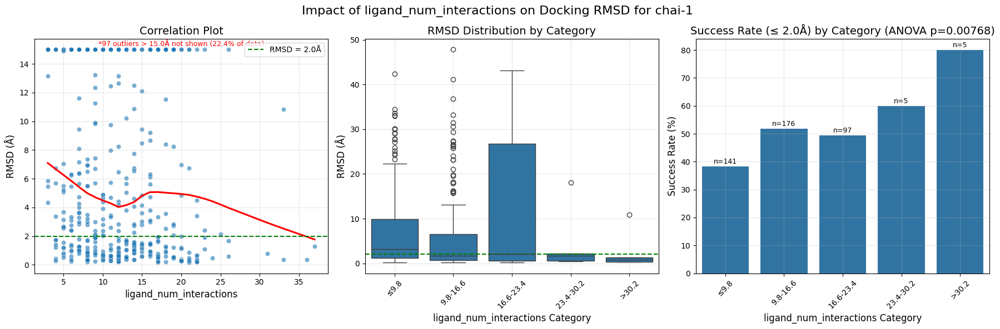


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.8          141     38.297872   7.925539
1                         9.8-16.6          176     51.704545   6.163357
2                        16.6-23.4           97     49.484536  10.731492
3                        23.4-30.2            5     60.000000   4.579829
4                            >30.2            5     80.000000   2.736223

ANOVA test: F=3.520, p=0.007680
Significant differences in RMSD across ligand_num_interactions categories
Welch ANOVA p=0.007680 (used unbalanced‑sizes variant)
Kruskal–Wallis H=8.672, p=0.069844

Impact of ligand_num_interactions on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.2295, p-value: 0.000002
Spearman correlation: -0.3116, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


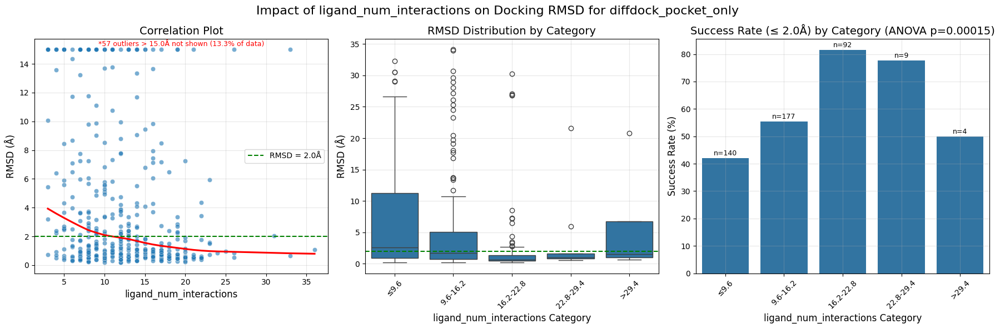


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.6          140     42.142857   7.217508
1                         9.6-16.2          177     55.367232   4.838312
2                        16.2-22.8           92     81.521739   2.390164
3                        22.8-29.4            9     77.777778   3.836750
4                            >29.4            4     50.000000   6.137022

ANOVA test: F=5.799, p=0.000150
Significant differences in RMSD across ligand_num_interactions categories
Welch ANOVA p=0.000150 (used unbalanced‑sizes variant)
Kruskal–Wallis H=44.069, p=0.000000

Impact of ligand_num_interactions on Docking RMSD for icm
Pearson correlation: -0.1480, p-value: 0.001646
Spearman correlation: -0.0945, p-value: 0.045230


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


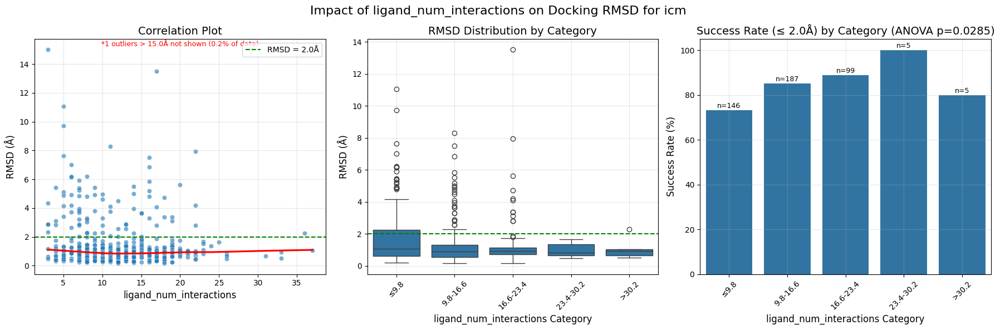


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.8          146     73.287671   1.849159
1                         9.8-16.6          187     85.026738   1.299946
2                        16.6-23.4           99     88.888889   1.341920
3                        23.4-30.2            5    100.000000   0.995056
4                            >30.2            5     80.000000   1.085094

ANOVA test: F=2.737, p=0.028464
Significant differences in RMSD across ligand_num_interactions categories
Welch ANOVA p=0.028464 (used unbalanced‑sizes variant)
Kruskal–Wallis H=6.934, p=0.139414

Impact of ligand_num_interactions on Docking RMSD for vina
Pearson correlation: 0.0801, p-value: 0.188556
Spearman correlation: 0.0505, p-value: 0.407216


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


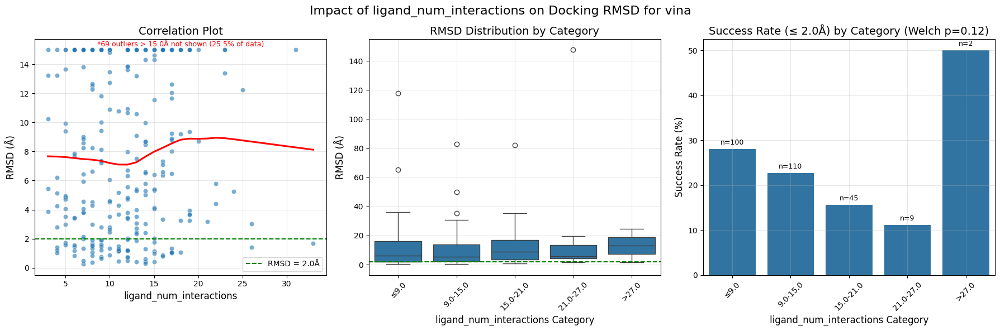


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤9.0          100     28.000000  10.810683
1                         9.0-15.0          110     22.727273   9.673762
2                        15.0-21.0           45     15.555556  12.762064
3                        21.0-27.0            9     11.111111  23.652730
4                            >27.0            2     50.000000  13.099599

ANOVA test: F=1.850, p=0.119669
Welch ANOVA p=0.119669 (used unbalanced‑sizes variant)
Kruskal–Wallis H=3.289, p=0.510734


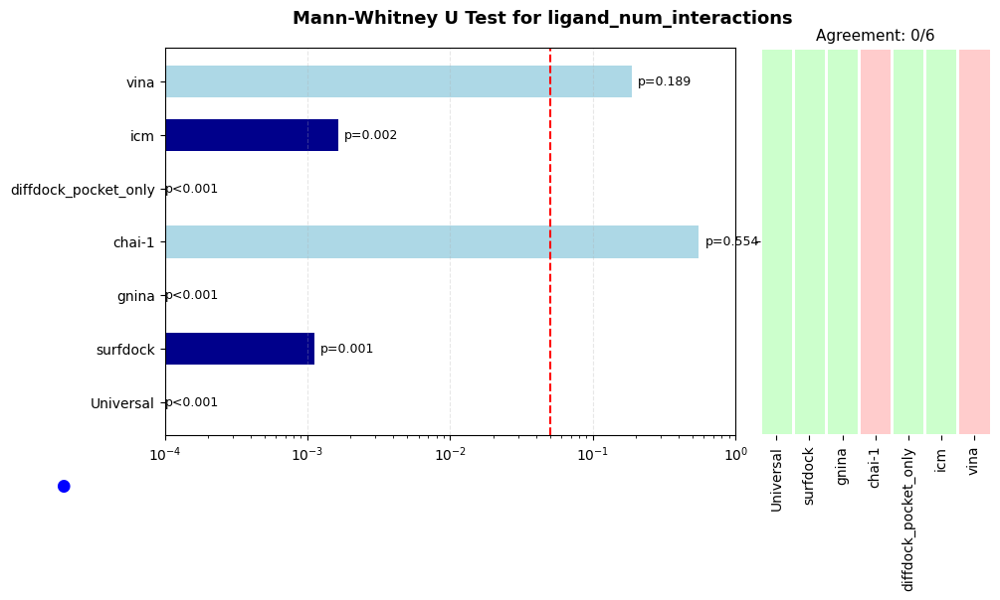

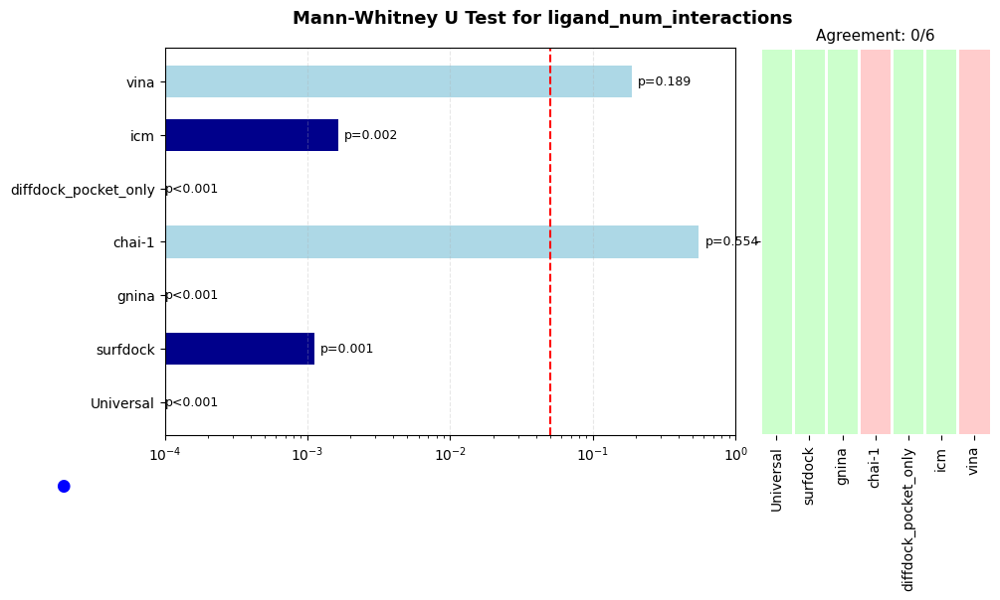

In [22]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_interactions",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_interactions",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_interactions",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_neighboring_residues